# Algorithms Assignment Project

- **Group Members:**
  * Hafiz Muhammad Hammad (02282413002)
  * Hafsa Danish (02282413)
- **Course Title:** Algorithms
- **Course Instructor:** Prof. Dr. Sajid Rashid
- **Program:** MPhil Bioinformatics Fall 24, Semester II



## Installations
This section handles the installation of required libraries and sets up the working environment.

### Mounting Google Drive and Setting Up Directories


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
! mkdir /content/drive/MyDrive/algo_project_hmh
! mkdir /content/drive/MyDrive/algo_project_hmh/plots

### Installing Required Libraries

In [3]:
!pip install biopython mdanalysis openmm matplotlib pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.7/108.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 62.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 65.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 114.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 96.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 4.4 MB/s eta 0:00:00


In [4]:
!pip install ramachandraw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.8/83.8 kB 3.4 MB/s eta 0:00:00


In [5]:
!pip install git+https://github.com/openmm/pdbfixer.git


  Cloning https://github.com/openmm/pdbfixer.git to /tmp/pip-req-build-p4c6dj62
  Running command git clone --filter=blob:none --quiet https://github.com/openmm/pdbfixer.git /tmp/pip-req-build-p4c6dj62
  Resolved https://github.com/openmm/pdbfixer.git to commit 5a6c129fb5b508610542634eafa218fb0e0671fe
  Preparing metadata (setup.py) ... done
  Created wheel for pdbfixer: filename=pdbfixer-1.11.0-py3-none-any.whl size=681851 sha256=9086f466039d60c2248e6b23c4be333e057a3d2b42afd7bde0ab59cb56c1b5ef
  Stored in directory: /tmp/pip-ephem-wheel-cache-efg1bfrf/wheels/31/a6/38/2829f7268aa0f15b7bcb8f243971f74d917beb4684dfb0c92f
Successfully built pdbfixer


## Getting the Protein and Processing it

### Downloading the Target Protein (2JAB)
Using this we will retrieves the PDB file for the target protein (2JAB) from the RCSB database and saves it in the specified directory.

In [6]:
from Bio.PDB import PDBList

# Initializing the downloader
pdbl = PDBList()
pdb_id = '2JAB'
destination = '/content/drive/MyDrive/algo_project_hmh'

pdbl.retrieve_pdb_file(pdb_id, pdir=destination, file_format='pdb')

# Renaming the ent file to pdb
import os
downloaded_file = os.path.join(destination, f"pdb{pdb_id.lower()}.ent")
new_file = os.path.join(destination, f"{pdb_id}.pdb")
os.rename(downloaded_file, new_file)

print(f"Downloaded and saved as: {new_file}")

Downloaded and saved as: /content/drive/MyDrive/algo_project_hmh/2JAB.pdb


### Processing the Protein (Fixing Missing Residues and Atoms)
The downloaded pdb file will be processed to fix missing residues, atoms, and adds missing hydrogens at a neutral pH of 7.0. The corrected structure is then saved to a new PDB file.

In [7]:
from pdbfixer import PDBFixer
from openmm.app import PDBFile

fixer = PDBFixer(filename='/content/drive/MyDrive/algo_project_hmh/2JAB.pdb')
fixer.findMissingResidues()
fixer.findMissingAtoms()
fixer.addMissingAtoms()
fixer.addMissingHydrogens(pH=7.0)

with open('/content/drive/MyDrive/algo_project_hmh/2jab_fix.pdb', 'w') as out:
    PDBFile.writeFile(fixer.topology, fixer.positions, out)

### Grouping the Chains You Wish to Keep
Parsing the PDB file to extract the unique chains and residues. It will list all the chains and the residues present in the structure, skipping heteroatoms and water molecules.

In [8]:
from Bio.PDB import PDBParser

pdb_file = "/content/drive/MyDrive/algo_project_hmh/2jab_fix.pdb"

parser = PDBParser(QUIET=True)
structure = parser.get_structure("structure", pdb_file)

chains_set = set()
residues_list = []
for model in structure:
    for chain in model:
        chain_id = chain.id
        chains_set.add(chain_id)
        for residue in chain:
            if residue.id[0] == ' ':  # Skip hetero/water atoms
                res_id = residue.id[1]
                res_name = residue.resname
                residues_list.append((chain_id, res_id, res_name))

# Printing all chains
print("Chains found:", sorted(chains_set))

# Printing all residues
print("\nResidues:")
for chain_id, res_id, res_name in residues_list:
    print(f"Chain {chain_id} - Residue {res_name} {res_id}")

Chains found: ['A', 'B', 'C', 'D', 'E', 'F']

Residues:
Chain A - Residue MET 1
Chain A - Residue ARG 2
Chain A - Residue GLY 3
Chain A - Residue SER 4
Chain A - Residue HIS 5
Chain A - Residue HIS 6
Chain A - Residue HIS 7
Chain A - Residue HIS 8
Chain A - Residue HIS 9
Chain A - Residue HIS 10
Chain A - Residue GLY 11
Chain A - Residue SER 12
Chain A - Residue ASP 13
Chain A - Residue LEU 14
Chain A - Residue GLY 15
Chain A - Residue LYS 16
Chain A - Residue LYS 17
Chain A - Residue LEU 18
Chain A - Residue LEU 19
Chain A - Residue GLU 20
Chain A - Residue ALA 21
Chain A - Residue ALA 22
Chain A - Residue ARG 23
Chain A - Residue ALA 24
Chain A - Residue GLY 25
Chain A - Residue GLN 26
Chain A - Residue ASP 27
Chain A - Residue ASP 28
Chain A - Residue GLU 29
Chain A - Residue VAL 30
Chain A - Residue ARG 31
Chain A - Residue ILE 32
Chain A - Residue LEU 33
Chain A - Residue MET 34
Chain A - Residue ALA 35
Chain A - Residue ASN 36
Chain A - Residue GLY 37
Chain A - Residue ALA 38
Cha

#### Extracting only Chain A

In [9]:
from Bio.PDB import PDBParser, PDBIO


pdb_file = "/content/drive/MyDrive/algo_project_hmh/2jab_fix.pdb"
parser = PDBParser(QUIET=True)
structure = parser.get_structure("structure", pdb_file)

# CHains to remove
remove_chains = {'B', 'C', 'D', 'E','F'}

from Bio.PDB.Structure import Structure
from Bio.PDB.Model import Model
from Bio.PDB.Chain import Chain
from Bio.PDB.Residue import Residue
from Bio.PDB.Atom import Atom

# hetatoms and water will also be removed
new_structure = Structure("filtered_structure")
model = Model(0)
new_structure.add(model)

for chain in structure[0]:
    if chain.id in remove_chains:
        continue

    new_chain = Chain(chain.id)
    for residue in chain:
        if residue.id[0] != ' ':
            continue
        new_chain.add(residue.copy())
    model.add(new_chain)

io = PDBIO()
io.set_structure(new_structure)
io.save("/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")

print("Chains found:", [chain.id for chain in new_structure[0]])

print("\nResidues:")
for chain in new_structure[0]:
    for residue in chain:
        print(f"Chain {chain.id} - Residue {residue.resname} {residue.id[1]}")

Chains found: ['A']

Residues:
Chain A - Residue MET 1
Chain A - Residue ARG 2
Chain A - Residue GLY 3
Chain A - Residue SER 4
Chain A - Residue HIS 5
Chain A - Residue HIS 6
Chain A - Residue HIS 7
Chain A - Residue HIS 8
Chain A - Residue HIS 9
Chain A - Residue HIS 10
Chain A - Residue GLY 11
Chain A - Residue SER 12
Chain A - Residue ASP 13
Chain A - Residue LEU 14
Chain A - Residue GLY 15
Chain A - Residue LYS 16
Chain A - Residue LYS 17
Chain A - Residue LEU 18
Chain A - Residue LEU 19
Chain A - Residue GLU 20
Chain A - Residue ALA 21
Chain A - Residue ALA 22
Chain A - Residue ARG 23
Chain A - Residue ALA 24
Chain A - Residue GLY 25
Chain A - Residue GLN 26
Chain A - Residue ASP 27
Chain A - Residue ASP 28
Chain A - Residue GLU 29
Chain A - Residue VAL 30
Chain A - Residue ARG 31
Chain A - Residue ILE 32
Chain A - Residue LEU 33
Chain A - Residue MET 34
Chain A - Residue ALA 35
Chain A - Residue ASN 36
Chain A - Residue GLY 37
Chain A - Residue ALA 38
Chain A - Residue ASP 39
Cha

## Structure Minimization  
Minimizing the protein structure using OpenMM's Langevin integrator. The function applies random perturbations to the atomic positions, followed by energy minimization to find a stable conformation. Multiple minimizations are performed, and the results are saved to separate PDB files.

In [10]:
import openmm
from openmm.app import *
from openmm import *
from openmm.unit import *
import numpy as np
import os

def minimize_structure(input_pdb, output_pdb, seed):
    pdb = PDBFile(input_pdb)
    forcefield = ForceField('amber14-all.xml', 'amber14/tip3p.xml')
    system = forcefield.createSystem(pdb.topology, nonbondedMethod=NoCutoff)

    integrator = LangevinIntegrator(300*kelvin, 1/picosecond, 0.002*picoseconds)
    simulation = Simulation(pdb.topology, system, integrator)

    positions = pdb.getPositions()
    pos_np = np.array(positions.value_in_unit(nanometer))

    np.random.seed(seed)
    perturb = np.random.normal(0, 0.1, size=pos_np.shape)  # in nanometers
    new_positions = pos_np + perturb

    # Converting numpy array back to Vec3 units (gpt)
    new_positions = [Vec3(*xyz)*nanometer for xyz in new_positions]
    simulation.context.setPositions(new_positions)
    simulation.minimizeEnergy()

    state = simulation.context.getState(getPositions=True, getEnergy=True)
    with open(output_pdb, 'w') as f:
        PDBFile.writeFile(simulation.topology, state.getPositions(), f)

os.makedirs("/content/drive/MyDrive/algo_project_hmh/minimized", exist_ok=True)

# Running 20 minimizations
for i in range(20):
    minimize_structure('/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb', f'/content/drive/MyDrive/algo_project_hmh/minimized/min_{i}.pdb', i)

## Residue COmparative Analysis

### RMSD Calculation  
Calculating the Root Mean Square Deviation (RMSD) between the reference and minimized structures for the loop residues. The calculation involves superimposing the test structures onto the reference structure based on the alpha-carbon atoms of the loop residues.


In [11]:
from Bio.PDB import PDBParser, Superimposer

# Set of loop residue numbers obtained from pymol by commands:
# log_open coords.txt
# iterate_state 1, 'sele', print(resi)
# log_close

loop_residues_set = set([
    37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
    70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
    103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
    131, 132, 133, 134, 135
])

def get_loop_residues(structure, loop_residue_ids):
    """Get residues in a structure that match provided residue numbers."""
    loops = []
    for model in structure:
        for chain in model:
            for res in chain:
                if res.id[1] in loop_residue_ids:
                    loops.append(res)
    return loops

def calculate_rmsd(ref_file, test_file, loop_residue_ids):
    parser = PDBParser(QUIET=True)
    ref_structure = parser.get_structure("ref", ref_file)
    test_structure = parser.get_structure("test", test_file)

    ref_atoms = [res['CA'] for res in get_loop_residues(ref_structure, loop_residue_ids) if 'CA' in res]
    test_atoms = [res['CA'] for res in get_loop_residues(test_structure, loop_residue_ids) if 'CA' in res]

    if len(ref_atoms) != len(test_atoms):
        raise ValueError("Mismatch in number of loop atoms between reference and test.")

    si = Superimposer()
    si.set_atoms(ref_atoms, test_atoms)
    si.apply(test_structure.get_atoms())

    return si.rms


ref = '/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb'
rmsds = []
for i in range(20):
    test = f'/content/drive/MyDrive/algo_project_hmh/minimized/min_{i}.pdb'
    rmsd = calculate_rmsd(ref, test, loop_residues_set)
    rmsds.append((i, rmsd))

print("RMSDs:", rmsds)

RMSDs: [(0, np.float64(0.7804228639859667)), (1, np.float64(1.3133315000430599)), (2, np.float64(1.2898606686042364)), (3, np.float64(1.171496165754279)), (4, np.float64(1.2784870818005547)), (5, np.float64(1.3218168730686077)), (6, np.float64(1.2980845739992715)), (7, np.float64(0.8970087989120241)), (8, np.float64(1.097449895156934)), (9, np.float64(0.9061645434299693)), (10, np.float64(0.7393321050494489)), (11, np.float64(0.9176844484424832)), (12, np.float64(0.9446866184798851)), (13, np.float64(0.8581586113375754)), (14, np.float64(0.8153081542229398)), (15, np.float64(0.768865059659271)), (16, np.float64(0.8733837609932824)), (17, np.float64(0.8518125778018485)), (18, np.float64(1.0048894045852892)), (19, np.float64(0.9717385561882869))]


### Energy Calculation  
Calculating the potential energy of each minimized structure using OpenMM. The energy is computed based on the Amber force field, and the result is recorded for each structure.

In [12]:
energies = []

def get_energy(input_pdb):
    pdb = PDBFile(input_pdb)
    forcefield = ForceField('amber14-all.xml', 'amber14/tip3p.xml')
    system = forcefield.createSystem(pdb.topology, nonbondedMethod=NoCutoff)

    integrator = LangevinIntegrator(300*kelvin, 1/picosecond, 0.002*picoseconds)
    simulation = Simulation(pdb.topology, system, integrator)
    simulation.context.setPositions(pdb.positions)

    state = simulation.context.getState(getEnergy=True)
    return state.getPotentialEnergy().value_in_unit(kilojoule_per_mole)

for i in range(20):
    e = get_energy(f'/content/drive/MyDrive/algo_project_hmh/minimized/min_{i}.pdb')
    energies.append((i, e))

print("Energies:", energies)


Energies: [(0, -8032.836608886719), (1, -8029.587112426758), (2, -7322.186149597168), (3, -7864.015335083008), (4, -7467.504699707031), (5, -8088.518966674805), (6, -8562.301391601562), (7, -8033.556076049805), (8, -7585.232772827148), (9, -8244.219650268555), (10, -7464.125579833984), (11, -6680.879592895508), (12, -7549.392150878906), (13, -6784.090240478516), (14, -8122.794250488281), (15, -7934.347930908203), (16, -7623.8330078125), (17, -7881.640869140625), (18, -7834.01741027832), (19, -7837.837249755859)]


### Graph of RMSD Against the Estimated Energy  
Creating a DataFrame to store the RMSD and energy values for each minimized structure. The lowest energy structure is selected, and a scatter plot is generated to visualize the relationship between loop RMSD and potential energy.

     Structure      RMSD  Energy (kJ/mol)
0    min_0.pdb  0.780423     -8032.836609
1    min_1.pdb  1.313332     -8029.587112
2    min_2.pdb  1.289861     -7322.186150
3    min_3.pdb  1.171496     -7864.015335
4    min_4.pdb  1.278487     -7467.504700
5    min_5.pdb  1.321817     -8088.518967
6    min_6.pdb  1.298085     -8562.301392
7    min_7.pdb  0.897009     -8033.556076
8    min_8.pdb  1.097450     -7585.232773
9    min_9.pdb  0.906165     -8244.219650
10  min_10.pdb  0.739332     -7464.125580
11  min_11.pdb  0.917684     -6680.879593
12  min_12.pdb  0.944687     -7549.392151
13  min_13.pdb  0.858159     -6784.090240
14  min_14.pdb  0.815308     -8122.794250
15  min_15.pdb  0.768865     -7934.347931
16  min_16.pdb  0.873384     -7623.833008
17  min_17.pdb  0.851813     -7881.640869
18  min_18.pdb  1.004889     -7834.017410
19  min_19.pdb  0.971739     -7837.837250
Most Stable Loop Conformation:
 Structure            min_6.pdb
RMSD                  1.298085
Energy (kJ/mol)   -8562.

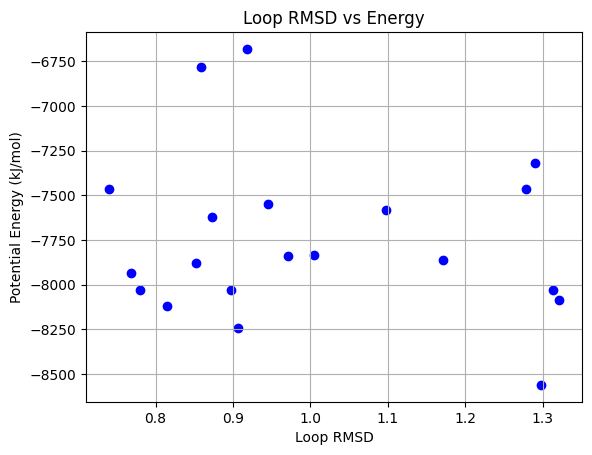

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame({
    'Structure': [f'min_{i}.pdb' for i in range(20)],
    'RMSD': [r[1] for r in rmsds],
    'Energy (kJ/mol)': [e[1] for e in energies]
})

print(df)
print("===================")
# Lowest energy structure
best_structure = df.sort_values(by='Energy (kJ/mol)').iloc[0]
print("Most Stable Loop Conformation:\n", best_structure)

plt.scatter(df['RMSD'], df['Energy (kJ/mol)'], color='blue')
plt.xlabel('Loop RMSD')
plt.ylabel('Potential Energy (kJ/mol)')
plt.title('Loop RMSD vs Energy')
plt.grid(True)
plt.show()

### Per-Residue RMSF  
Calculating the Root Mean Square Fluctuation (RMSF) for each residue by aligning all minimized structures to the reference structure. The RMSF values indicate the flexibility of each residue across all conformations.

In [14]:
from Bio.PDB import PDBParser, Superimposer
import numpy as np
import os

parser = PDBParser(QUIET=True)
ref_structure = parser.get_structure("ref", "/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")
ref_model = list(ref_structure.get_models())[0]

minimized_files = sorted([f"/content/drive/MyDrive/algo_project_hmh/minimized/{f}" for f in os.listdir("/content/drive/MyDrive/algo_project_hmh/minimized") if f.endswith(".pdb")])

# Geting all CA atoms from reference structure
ref_atoms = [(res.id[1], res['CA']) for chain in ref_model for res in chain if 'CA' in res]

# Dictionary to hold all aligned CA positions by residue number
positions = {res_id: [] for res_id, atom in ref_atoms}

# Aligning each minimized structure to reference and store CA atom coordinates <google>
for pdb_file in minimized_files:
    test_structure = parser.get_structure("test", pdb_file)
    test_model = list(test_structure.get_models())[0]

    # Extracting CA atoms for alignment
    test_atoms = [res['CA'] for chain in test_model for res in chain if 'CA' in res and res.id[1] in positions]

    si = Superimposer()
    ref_ca = [atom for _, atom in ref_atoms if _ in [res.id[1] for res in test_model.get_residues() if 'CA' in res]]
    si.set_atoms(ref_ca, test_atoms)
    si.apply(test_model.get_atoms())

    # After alignment, collecting coordinates
    for chain in test_model:
        for res in chain:
            if 'CA' in res:
                res_id = res.id[1]
                if res_id in positions:
                    coord = res['CA'].get_coord()
                    positions[res_id].append(coord)

# Calculating RMSF for each residue
rmsf_values = {}
for res_id, coords in positions.items():
    coords = np.array(coords)
    if len(coords) > 1:
        mean_coord = np.mean(coords, axis=0)
        squared_diffs = np.sum((coords - mean_coord) ** 2, axis=1)
        rmsf = np.sqrt(np.mean(squared_diffs))
        rmsf_values[res_id] = rmsf

# Print results
for res_id, rmsf in sorted(rmsf_values.items()):
    print(f"Residue {res_id}: RMSF = {rmsf:.3f} Å")

import pandas as pd

rmsf_df = pd.DataFrame(sorted(rmsf_values.items()), columns=["Residue", "RMSF (Å)"])
rmsf_df.to_csv("/content/drive/MyDrive/algo_project_hmh/rmsf_results.csv", index=False)

print("\n RMSF results saved to 'rmsf_results.csv'")

Residue 1: RMSF = 1.436 Å
Residue 2: RMSF = 0.919 Å
Residue 3: RMSF = 1.077 Å
Residue 4: RMSF = 1.378 Å
Residue 5: RMSF = 1.036 Å
Residue 6: RMSF = 0.851 Å
Residue 7: RMSF = 1.028 Å
Residue 8: RMSF = 1.101 Å
Residue 9: RMSF = 1.095 Å
Residue 10: RMSF = 0.960 Å
Residue 11: RMSF = 1.217 Å
Residue 12: RMSF = 1.551 Å
Residue 13: RMSF = 0.991 Å
Residue 14: RMSF = 0.863 Å
Residue 15: RMSF = 0.745 Å
Residue 16: RMSF = 0.668 Å
Residue 17: RMSF = 0.708 Å
Residue 18: RMSF = 0.588 Å
Residue 19: RMSF = 0.512 Å
Residue 20: RMSF = 0.611 Å
Residue 21: RMSF = 0.750 Å
Residue 22: RMSF = 0.707 Å
Residue 23: RMSF = 0.824 Å
Residue 24: RMSF = 0.810 Å
Residue 25: RMSF = 0.605 Å
Residue 26: RMSF = 0.817 Å
Residue 27: RMSF = 0.680 Å
Residue 28: RMSF = 0.580 Å
Residue 29: RMSF = 0.599 Å
Residue 30: RMSF = 0.616 Å
Residue 31: RMSF = 0.534 Å
Residue 32: RMSF = 0.474 Å
Residue 33: RMSF = 0.532 Å
Residue 34: RMSF = 0.578 Å
Residue 35: RMSF = 0.791 Å
Residue 36: RMSF = 0.900 Å
Residue 37: RMSF = 0.986 Å
Residue 38

#### Average RMSF Plot  
Generating a plot to visualize the per-residue RMSF values across all minimized structures. The plot shows the flexibility of each residue in the loop region, with larger RMSF values indicating higher flexibility.

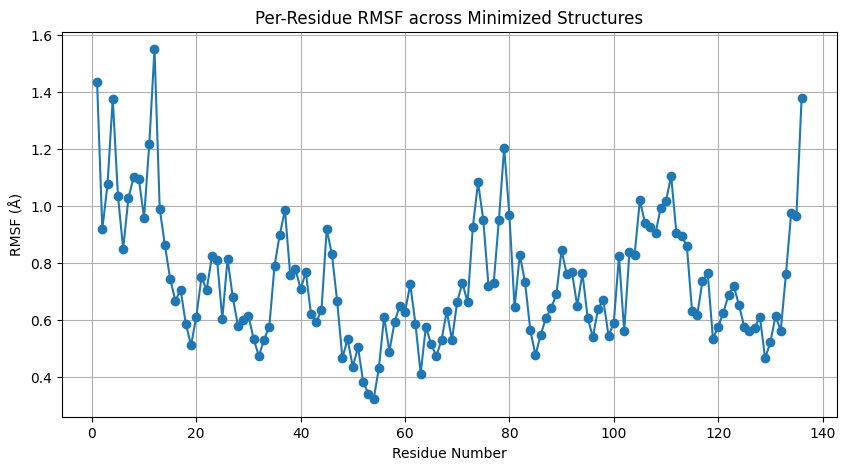

In [15]:
import matplotlib.pyplot as plt

res_ids = list(sorted(rmsf_values))
rmsf_list = [rmsf_values[res] for res in res_ids]

plt.figure(figsize=(10,5))
plt.plot(res_ids, rmsf_list, marker='o')
plt.xlabel("Residue Number")
plt.ylabel("RMSF (Å)")
plt.title("Per-Residue RMSF across Minimized Structures")
plt.grid(True)
plt.show()


#### Combine RMSF plot for all minimized structures

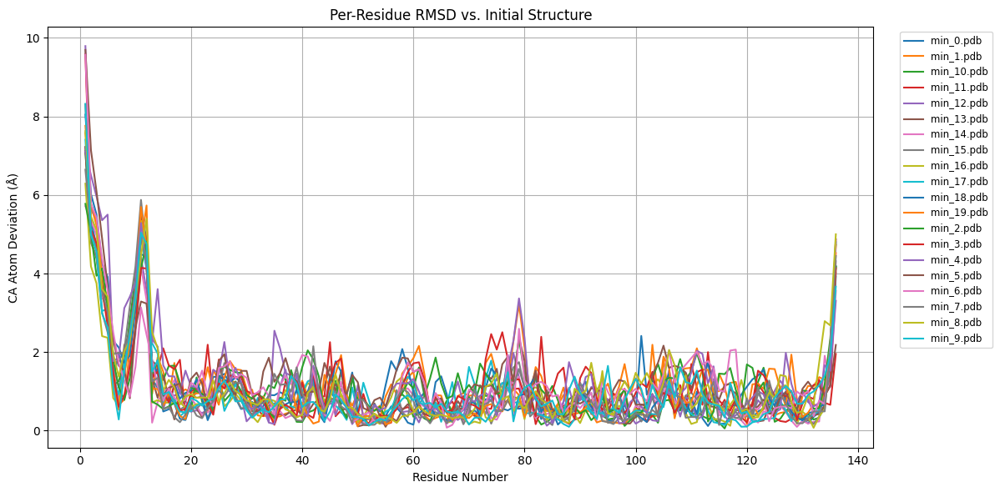

In [16]:
from Bio.PDB import PDBParser, Superimposer
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd


parser = PDBParser(QUIET=True)
ref_structure = parser.get_structure("ref", "/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")
ref_model = list(ref_structure.get_models())[0]


ref_ca_dict = {
    res.id[1]: res['CA'].get_coord()
    for chain in ref_model
    for res in chain
    if 'CA' in res
}


all_deviation_data = {}  # structure_name -> {res_id: deviation}
minimized_files = sorted([f for f in os.listdir("/content/drive/MyDrive/algo_project_hmh/minimized") if f.endswith(".pdb")])

for pdb_file in minimized_files:
    struct_path = os.path.join("/content/drive/MyDrive/algo_project_hmh/minimized", pdb_file)
    structure = parser.get_structure(pdb_file, struct_path)
    model = list(structure.get_models())[0]

    test_ca_dict = {
        res.id[1]: res['CA'].get_coord()
        for chain in model
        for res in chain
        if 'CA' in res and res.id[1] in ref_ca_dict
    }

    common_res_ids = sorted(test_ca_dict.keys())
    ref_atoms = [ref_ca_dict[res_id] for res_id in common_res_ids]
    test_atoms = [test_ca_dict[res_id] for res_id in common_res_ids]

    si = Superimposer()
    si.set_atoms(
        [ref_structure[0]["A"][res_id]["CA"] for res_id in common_res_ids],
        [structure[0]["A"][res_id]["CA"] for res_id in common_res_ids]
    )
    si.apply(model.get_atoms())

    deviation_dict = {}
    for res_id in common_res_ids:
        ref_coord = ref_structure[0]["A"][res_id]["CA"].get_coord()
        test_coord = structure[0]["A"][res_id]["CA"].get_coord()
        deviation = np.linalg.norm(test_coord - ref_coord)
        deviation_dict[res_id] = deviation

    all_deviation_data[pdb_file] = deviation_dict

df = pd.DataFrame(all_deviation_data).sort_index()
df.to_csv("/content/drive/MyDrive/algo_project_hmh/per_structure_residue_deviations.csv")

plt.figure(figsize=(12, 6))
for col in df.columns:
    plt.plot(df.index, df[col], label=col)

plt.xlabel("Residue Number")
plt.ylabel("CA Atom Deviation (Å)")
plt.title("Per-Residue RMSD vs. Initial Structure")
plt.legend(fontsize='small', loc='upper right', bbox_to_anchor=(1.15, 1.0))
plt.grid(True)
plt.tight_layout()
plt.show()

### Genearting Individual RMSD Plots  
For each minimized structure generating and saving individual RMSD plots showing the per-residue deviations from the initial structure. Each plot is saved in the 'rmsd_plots' directory for easy reference.

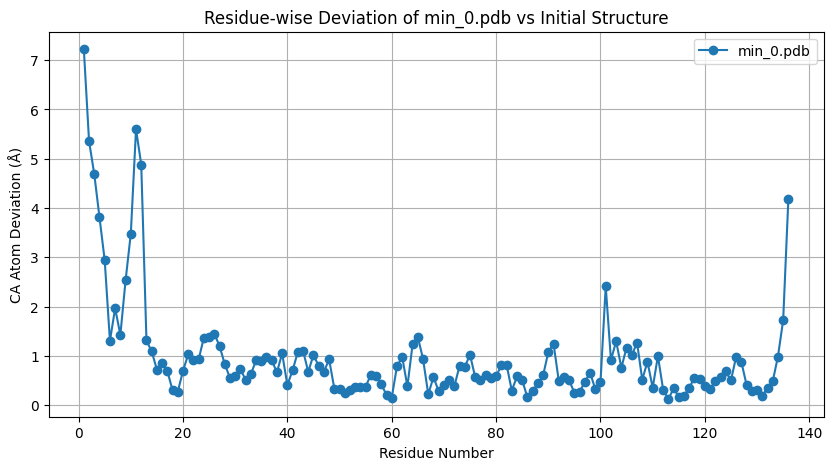

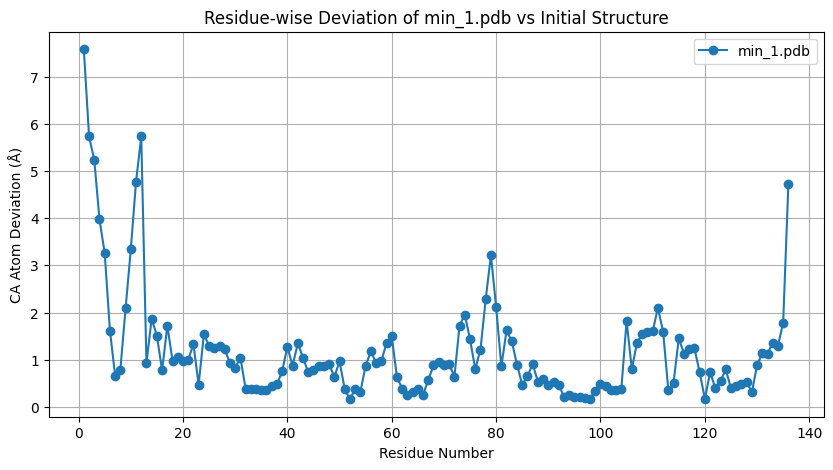

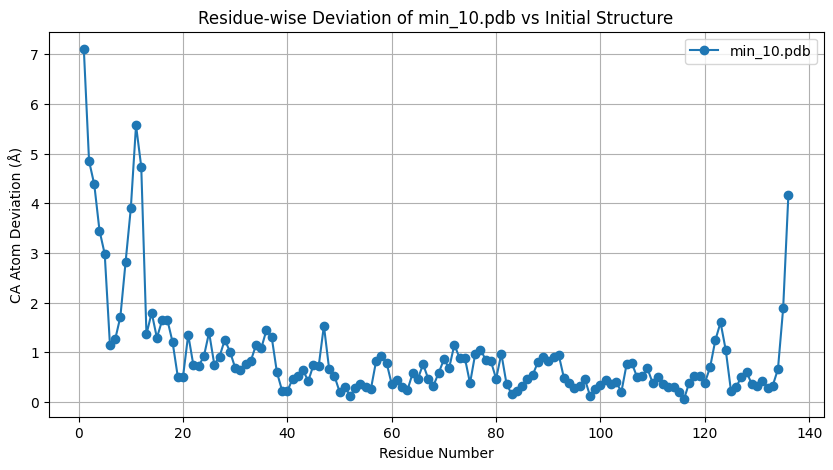

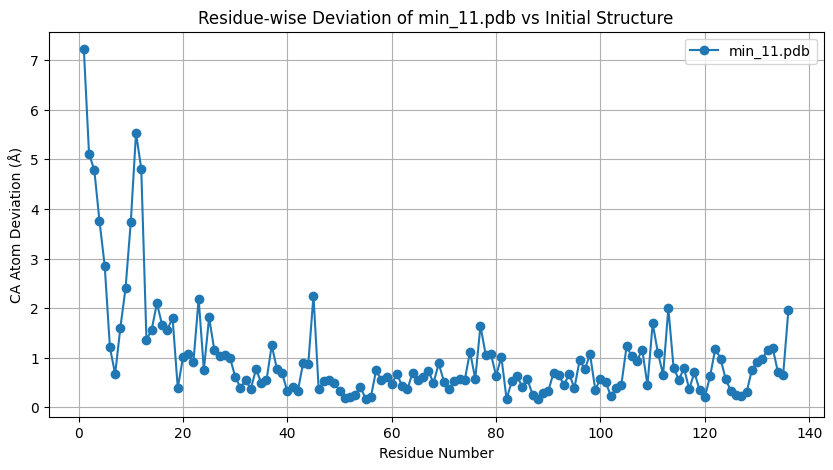

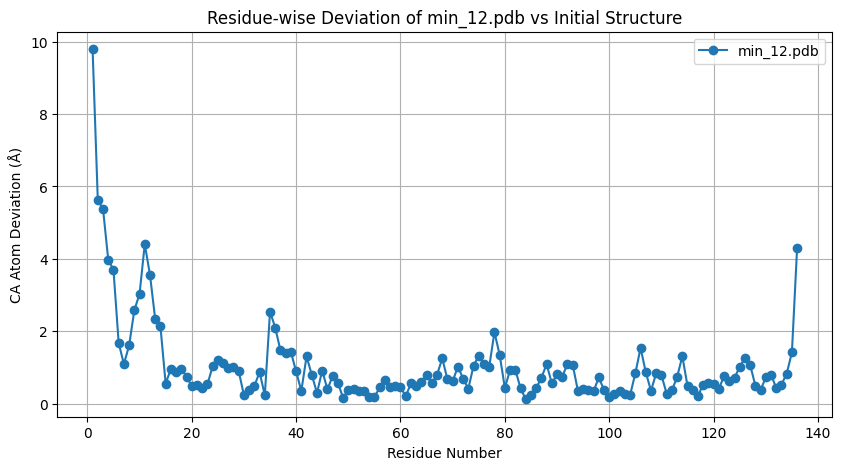

...

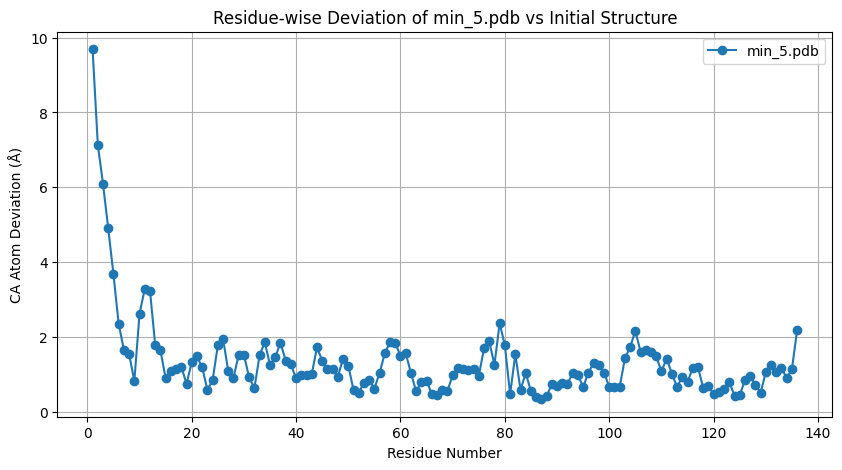

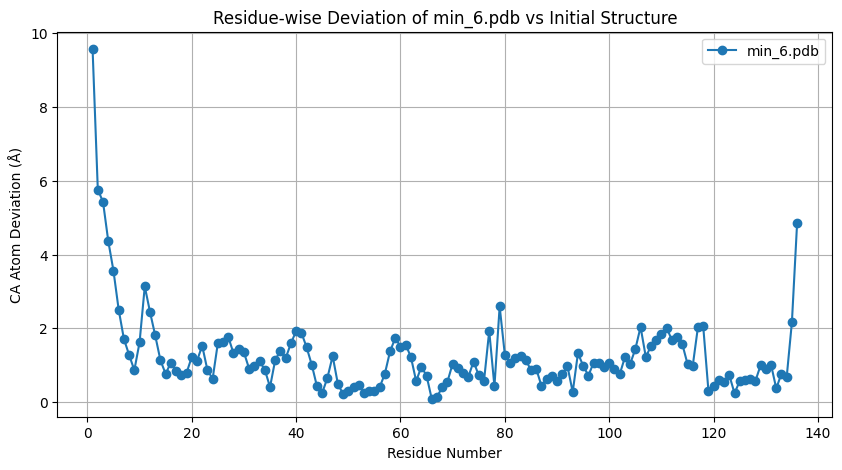

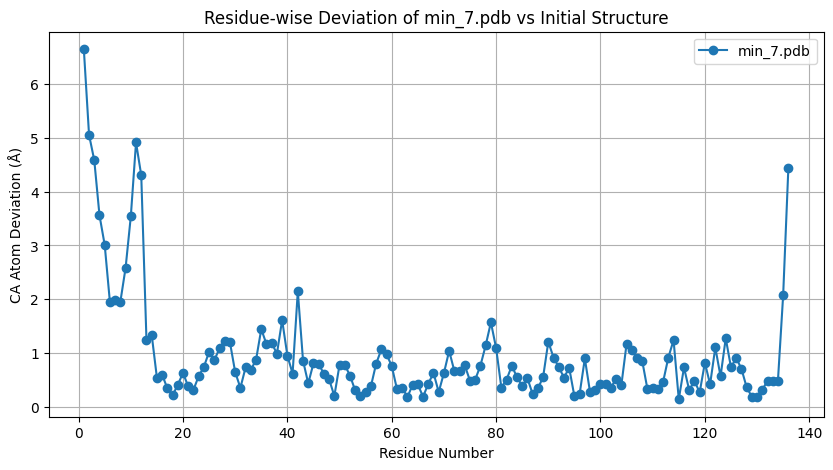

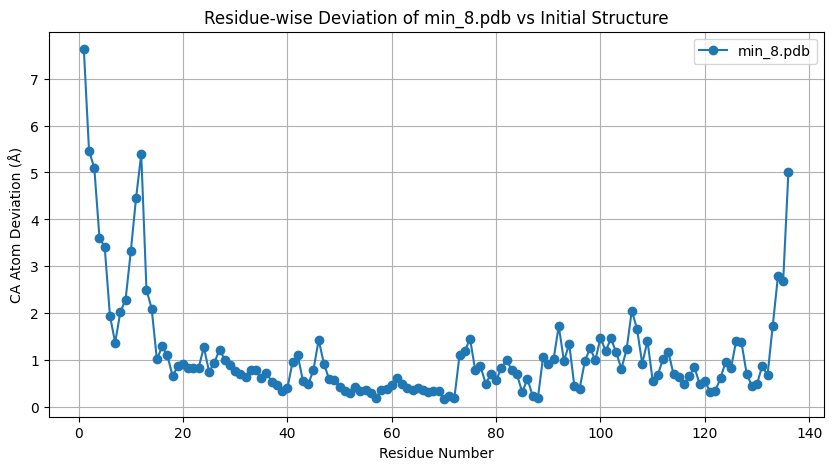

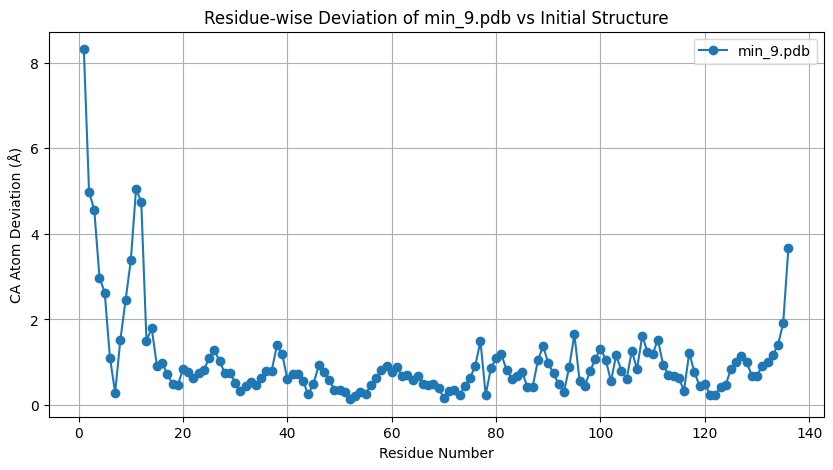

All individual RMSD plots saved in 'rmsd_plots/' directory.


In [17]:
import matplotlib.pyplot as plt
import pandas as pd

# Load CSV
df = pd.read_csv("/content/drive/MyDrive/algo_project_hmh/per_structure_residue_deviations.csv", index_col=0)

# Create a folder to save individual plots <python turtorials datacamp>
import os
os.makedirs("/content/drive/MyDrive/algo_project_hmh/rmsd_plots", exist_ok=True)

for struct_name in df.columns:
    plt.figure(figsize=(10, 5))
    plt.plot(df.index, df[struct_name], label=struct_name, color='tab:blue', marker='o')

    plt.xlabel("Residue Number")
    plt.ylabel("CA Atom Deviation (Å)")
    plt.title(f"Residue-wise Deviation of {struct_name} vs Initial Structure")
    plt.legend()
    plt.grid(True)
    plt.show()


    filename = f"/content/drive/MyDrive/algo_project_hmh/rmsd_plots/{struct_name}_rmsd_plot.png"
    plt.tight_layout()
    plt.savefig(filename)
    plt.close()

print("All individual RMSD plots saved in 'rmsd_plots/' directory.")


## Loop Displacemnet Plots

Similar code chunks were used to genearet diffferent kind of plots separately.

### Loop Residue Displacement Plot  
For each minimized structure, calculating the displacement (Euclidean distance) of the loop residues after alignment with the reference structure. A plot is generated for each structure, showing the displacement of each loop residue. The plots are saved individually for further analysis.

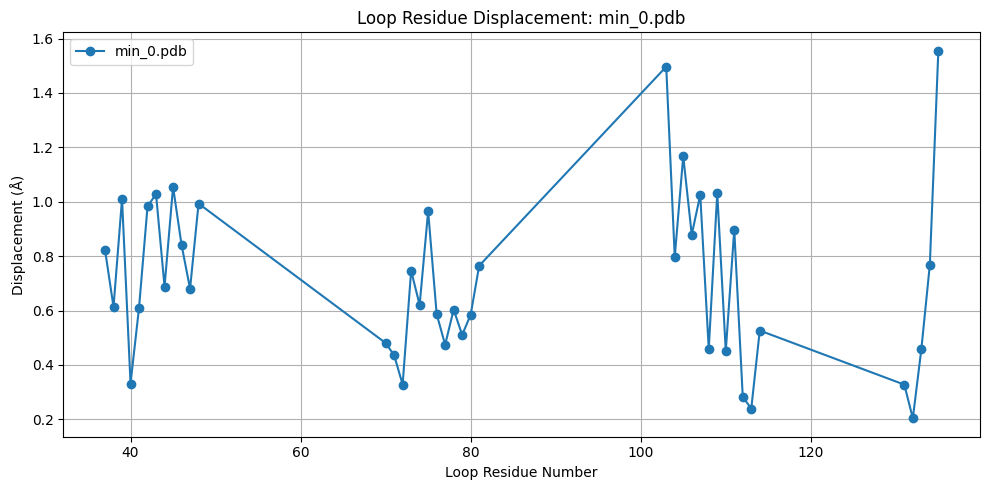

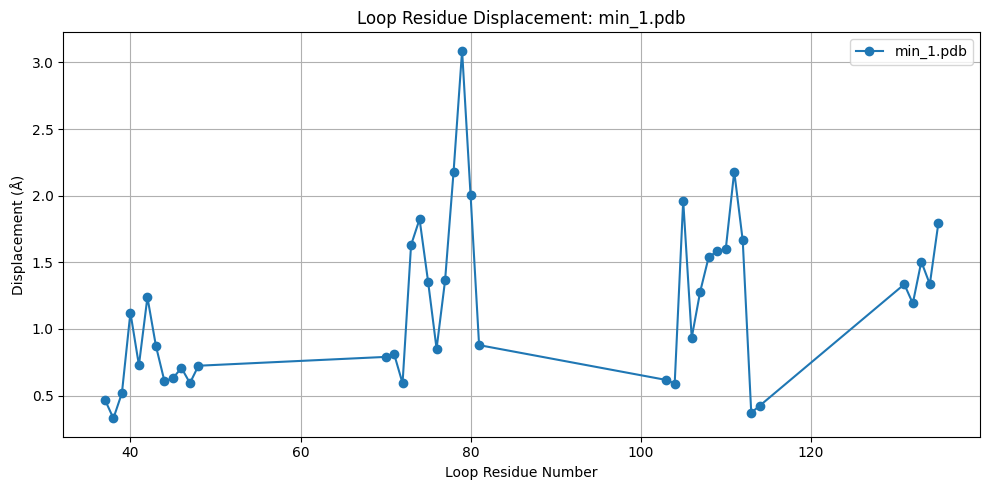

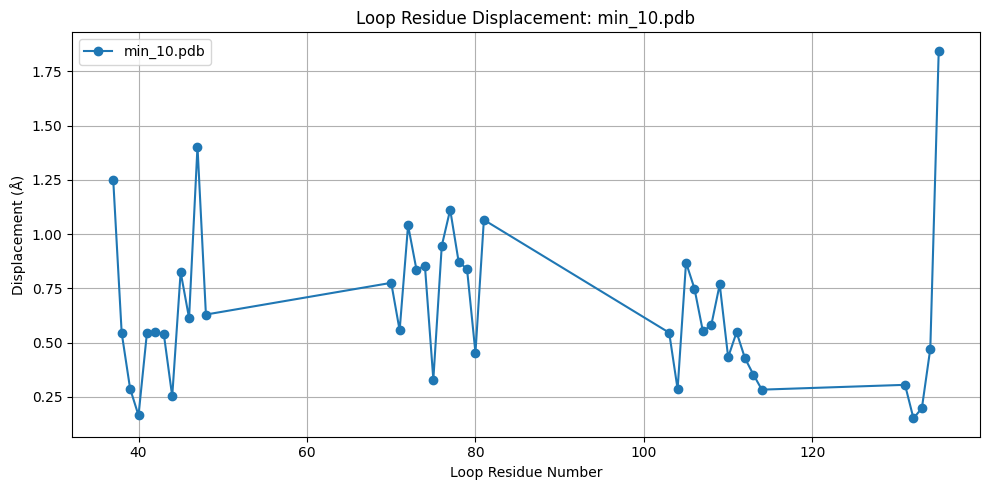

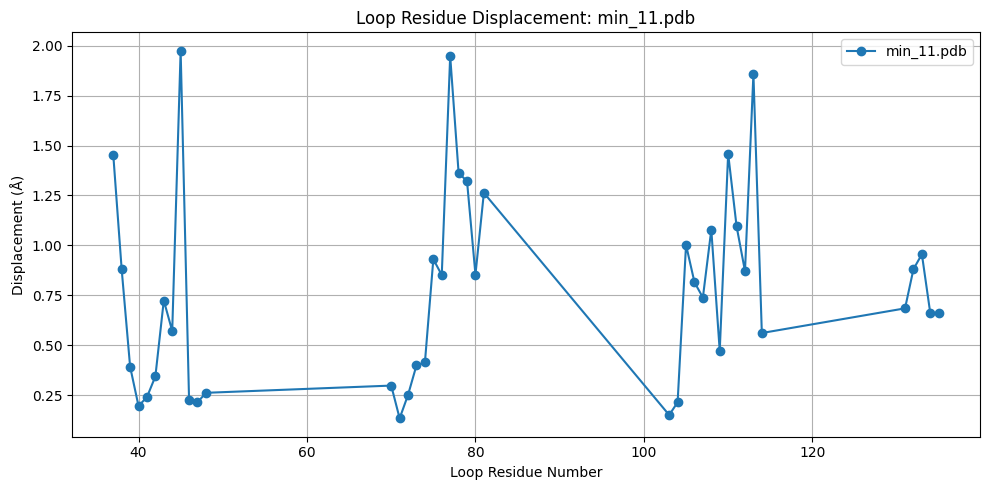

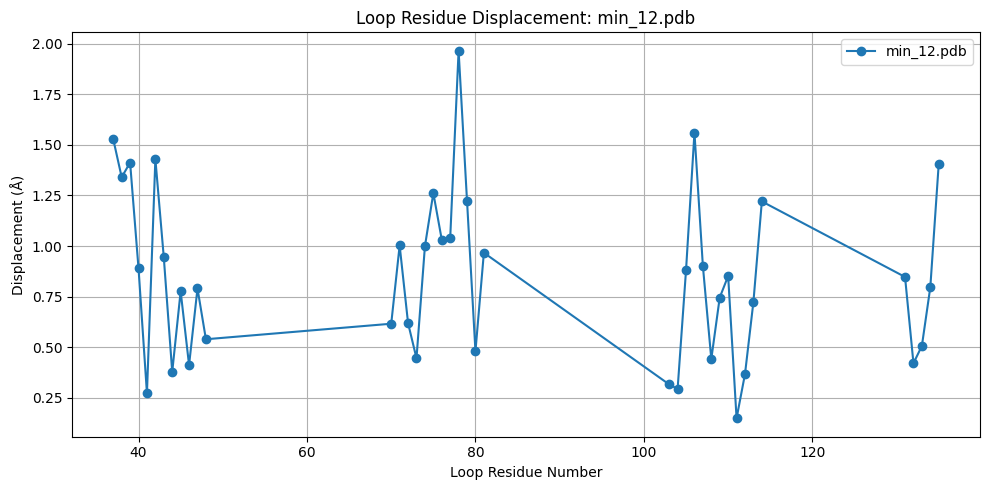

...

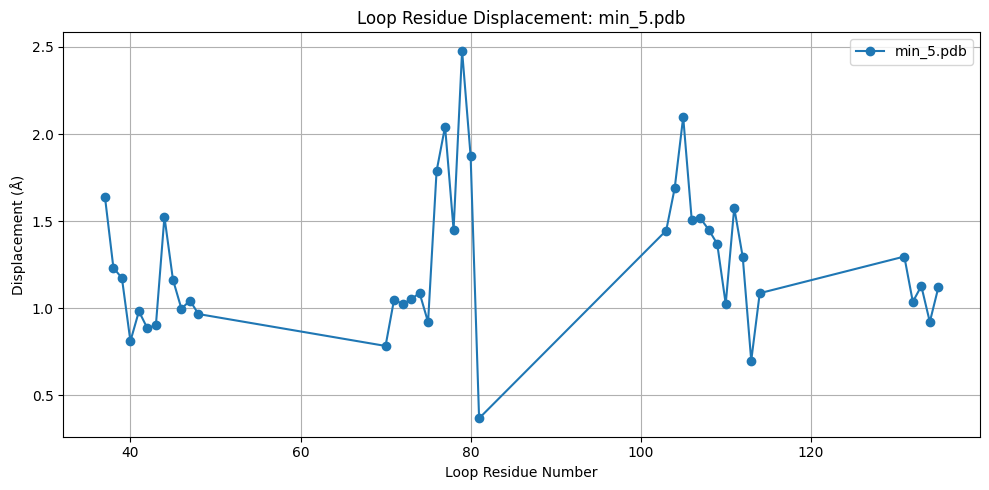

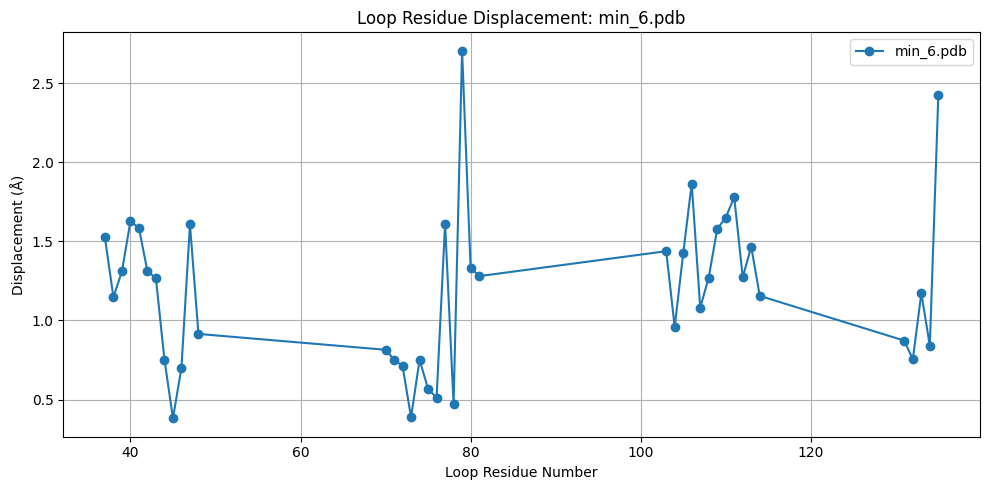

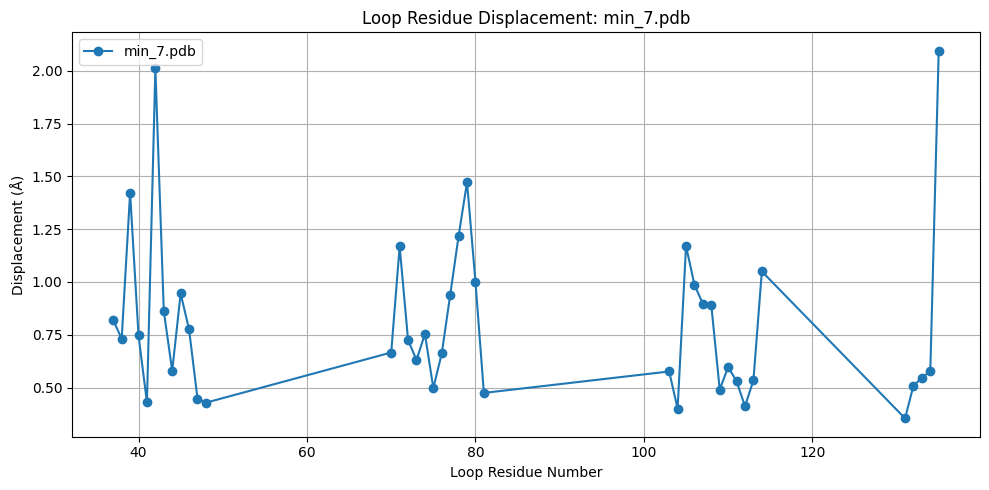

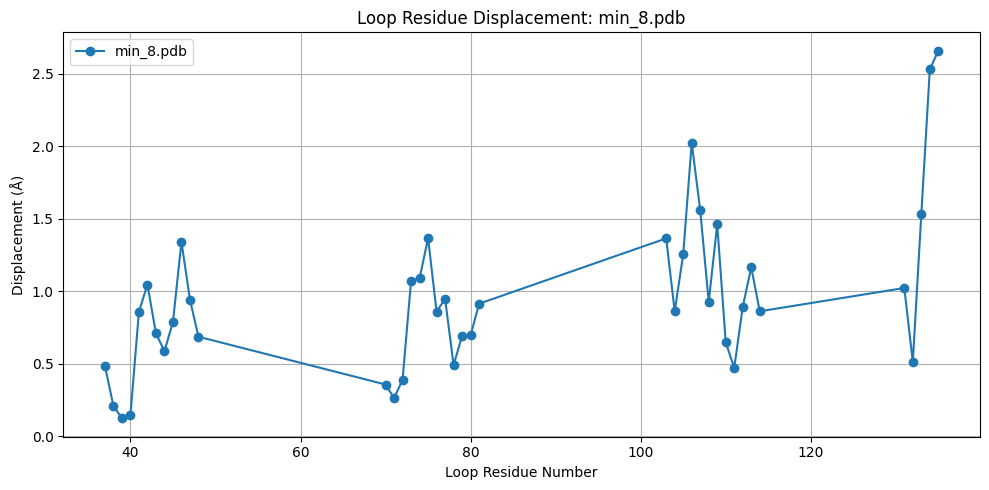

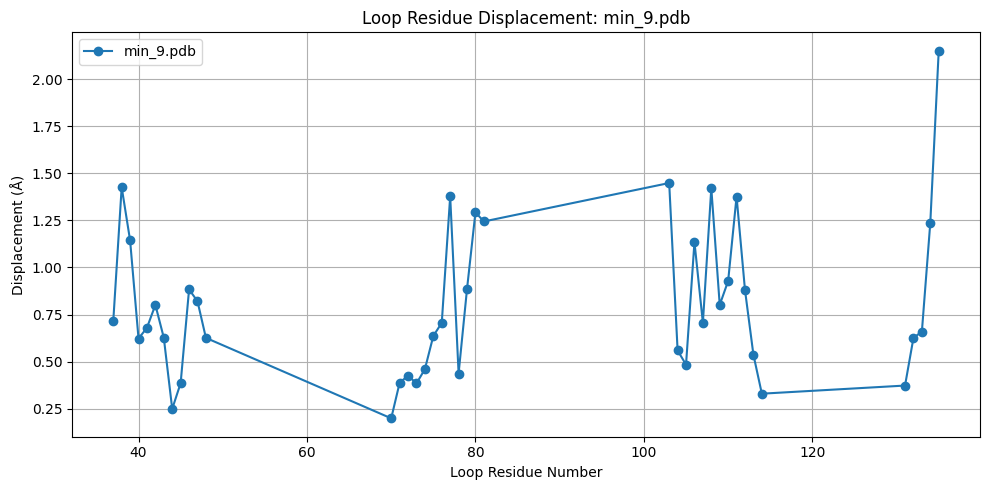

In [18]:
from Bio.PDB import PDBParser, Superimposer
import numpy as np
import os
import matplotlib.pyplot as plt

# Set of loop residue numbers
loop_residues_set = set([
    37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
    70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
    103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
    131, 132, 133, 134, 135
])

parser = PDBParser(QUIET=True)
ref_structure = parser.get_structure("ref", "/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")
ref_model = list(ref_structure.get_models())[0]

# Looping over minimized structures
minimized_files = sorted([f for f in os.listdir("/content/drive/MyDrive/algo_project_hmh/minimized") if f.endswith(".pdb")])

for pdb_file in minimized_files:
    test_structure = parser.get_structure("test", os.path.join("/content/drive/MyDrive/algo_project_hmh/minimized", pdb_file))
    test_model = list(test_structure.get_models())[0]

    ref_atoms = []
    test_atoms = []

    for chain in test_model:
        for res in chain:
            resid = res.id[1]
            if 'CA' in res and resid in loop_residues_set:
                try:
                    ref_ca = ref_model[chain.id][res.id]['CA']
                    ref_atoms.append(ref_ca)
                    test_atoms.append(res['CA'])
                except KeyError:
                    continue  # skip residues not found in reference

    if len(ref_atoms) == 0 or len(test_atoms) == 0 or len(ref_atoms) != len(test_atoms):
        print(f"Skipping {pdb_file} due to alignment mismatch.")
        continue

    si = Superimposer()
    si.set_atoms(ref_atoms, test_atoms)
    si.apply(test_model.get_atoms())

    # Computing displacement for each loop residue
    displacements = []
    residue_ids = []

    for chain in test_model:
        for res in chain:
            resid = res.id[1]
            if 'CA' in res and resid in loop_residues_set:
                try:
                    ref_ca = ref_model[chain.id][res.id]['CA'].get_coord()
                    test_ca = res['CA'].get_coord()
                    dist = np.linalg.norm(test_ca - ref_ca)
                    displacements.append(dist)
                    residue_ids.append(resid)
                except KeyError:
                    continue


    sorted_pairs = sorted(zip(residue_ids, displacements))
    residue_ids_sorted, displacements_sorted = zip(*sorted_pairs)


    plt.figure(figsize=(10, 5))
    plt.plot(residue_ids_sorted, displacements_sorted, marker='o', label=pdb_file)
    plt.xlabel("Loop Residue Number")
    plt.ylabel("Displacement (Å)")
    plt.title(f"Loop Residue Displacement: {pdb_file}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"/content/drive/MyDrive/algo_project_hmh/loop_disp_{pdb_file.replace('.pdb', '')}.png")
    plt.show()
    plt.close()

### Combined Loop Residue Displacement Plot  
Computing and plotting the displacement of loop residues for all minimized structures compared to the reference structure. The displacements are calculated after superimposing the structures based on their CA atoms. The resulting plot displays the displacement of each residue across the minimized structures, showing the variability in the loop conformation. The final plot is saved as a single image.

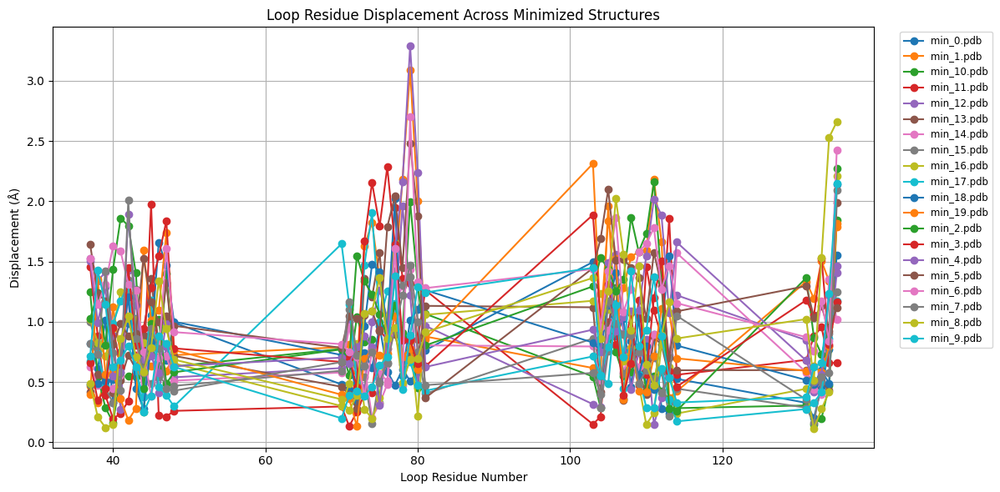

In [19]:
# <gpt + google>
from Bio.PDB import PDBParser, Superimposer
import numpy as np
import os
import matplotlib.pyplot as plt

loop_residues_set = set([
    37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
    70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
    103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
    131, 132, 133, 134, 135
])

parser = PDBParser(QUIET=True)
ref_structure = parser.get_structure("ref", "/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")
ref_model = list(ref_structure.get_models())[0]

plt.figure(figsize=(12, 6))

minimized_files = sorted([f for f in os.listdir("/content/drive/MyDrive/algo_project_hmh/minimized") if f.endswith(".pdb")])

for pdb_file in minimized_files:
    test_structure = parser.get_structure("test", os.path.join("/content/drive/MyDrive/algo_project_hmh/minimized", pdb_file))
    test_model = list(test_structure.get_models())[0]

    ref_atoms = []
    test_atoms = []

    for chain in test_model:
        for res in chain:
            resid = res.id[1]
            if 'CA' in res and resid in loop_residues_set:
                try:
                    ref_ca = ref_model[chain.id][res.id]['CA']
                    ref_atoms.append(ref_ca)
                    test_atoms.append(res['CA'])
                except KeyError:
                    continue

    if len(ref_atoms) == 0 or len(test_atoms) == 0 or len(ref_atoms) != len(test_atoms):
        print(f"Skipping {pdb_file} due to alignment mismatch.")
        continue

    si = Superimposer()
    si.set_atoms(ref_atoms, test_atoms)
    si.apply(test_model.get_atoms())

    displacements = []
    residue_ids = []

    for chain in test_model:
        for res in chain:
            resid = res.id[1]
            if 'CA' in res and resid in loop_residues_set:
                try:
                    ref_ca = ref_model[chain.id][res.id]['CA'].get_coord()
                    test_ca = res['CA'].get_coord()
                    dist = np.linalg.norm(test_ca - ref_ca)
                    displacements.append(dist)
                    residue_ids.append(resid)
                except KeyError:
                    continue

    sorted_pairs = sorted(zip(residue_ids, displacements))
    residue_ids_sorted, displacements_sorted = zip(*sorted_pairs)

    plt.plot(residue_ids_sorted, displacements_sorted, marker='o', label=pdb_file)

plt.xlabel("Loop Residue Number")
plt.ylabel("Displacement (Å)")
plt.title("Loop Residue Displacement Across Minimized Structures")
plt.legend(fontsize='small', loc='upper right', bbox_to_anchor=(1.15, 1.0))
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/algo_project_hmh/loop_displacement_all_structures.png")
plt.show()

### RMSF Calculation for only loop Residues
After aligning each minimized model to the reference structure using CA atoms, the fluctuation of each loop residue is calculated based on its deviation from the mean position.  
The final plot highlights the flexibility of loop regions and identifies residues with higher structural variability.

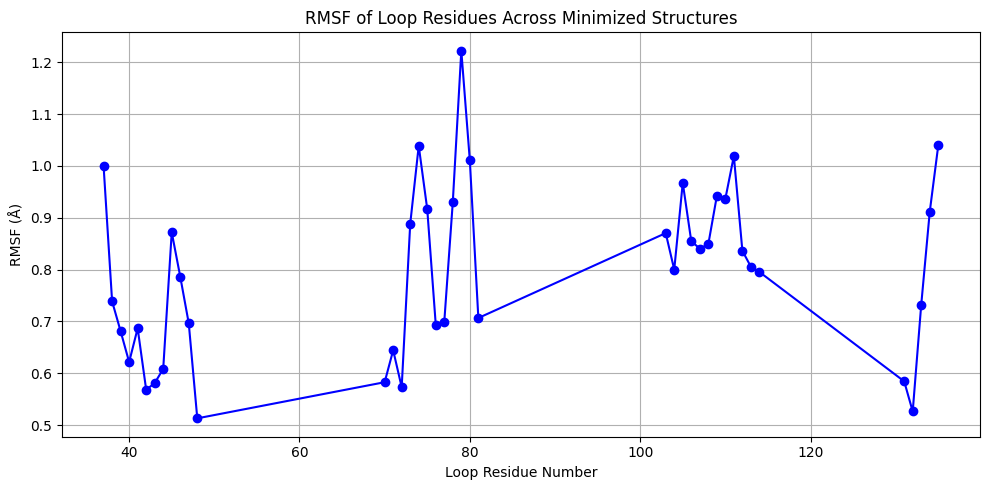

In [20]:
from Bio.PDB import PDBParser, Superimposer
import numpy as np
import os
import matplotlib.pyplot as plt
from collections import defaultdict

loop_residues_set = set([
    37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
    70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
    103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
    131, 132, 133, 134, 135
])

parser = PDBParser(QUIET=True)
ref_structure = parser.get_structure("ref", "/content/drive/MyDrive/algo_project_hmh/2jab_fixed.pdb")
ref_model = list(ref_structure.get_models())[0]

ref_coords = {}
for chain in ref_model:
    for res in chain:
        if 'CA' in res and res.id[1] in loop_residues_set:
            ref_coords[(chain.id, res.id[1])] = res['CA'].get_coord()

residue_coords = defaultdict(list)

minimized_files = sorted([f for f in os.listdir("/content/drive/MyDrive/algo_project_hmh/minimized") if f.endswith(".pdb")])

for pdb_file in minimized_files:
    test_structure = parser.get_structure("test", os.path.join("/content/drive/MyDrive/algo_project_hmh/minimized", pdb_file))
    test_model = list(test_structure.get_models())[0]

    ref_atoms = []
    test_atoms = []

    for chain in test_model:
        for res in chain:
            key = (chain.id, res.id[1])
            if 'CA' in res and key in ref_coords:
                test_atoms.append(res['CA'])
                ref_atoms.append(ref_model[chain.id][res.id]['CA'])

    if len(ref_atoms) == 0 or len(test_atoms) == 0 or len(ref_atoms) != len(test_atoms):
        print(f"Skipping {pdb_file}: alignment issue.")
        continue


    si = Superimposer()
    si.set_atoms(ref_atoms, test_atoms)
    si.apply(test_model.get_atoms())

    for chain in test_model:
        for res in chain:
            key = (chain.id, res.id[1])
            if 'CA' in res and key in ref_coords:
                residue_coords[res.id[1]].append(res['CA'].get_coord())

# Calculating RMSF (standard deviation of distance from mean position)
rmsf_values = {}
for resid, coords_list in residue_coords.items():
    coords_array = np.array(coords_list)
    if coords_array.shape[0] < 2:
        continue
    mean_coord = np.mean(coords_array, axis=0)
    diffs = coords_array - mean_coord
    sq_dists = np.sum(diffs**2, axis=1)
    rmsf = np.sqrt(np.mean(sq_dists))
    rmsf_values[resid] = rmsf

residue_ids_sorted = sorted(rmsf_values.keys())
rmsf_sorted = [rmsf_values[r] for r in residue_ids_sorted]

plt.figure(figsize=(10, 5))
plt.plot(residue_ids_sorted, rmsf_sorted, marker='o', linestyle='-', color='blue')
plt.xlabel("Loop Residue Number")
plt.ylabel("RMSF (Å)")
plt.title("RMSF of Loop Residues Across Minimized Structures")
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/algo_project_hmh/loop_rmsf_plot.png")
plt.show()


### Ramachandran Plot Generation with RamachanDraw

Generating Ramachandran plots for all structures, including the original, fixed, and minimized models, using the RamachanDraw library.  https://github.com/alxdrcirilo/ramachandraw.git
Each structure is processed to extract phi and psi angles and visualize them on a 2D density plot.  
The resulting plots reveal the conformational quality and stereochemical validity of the backbone dihedral angles for each model.

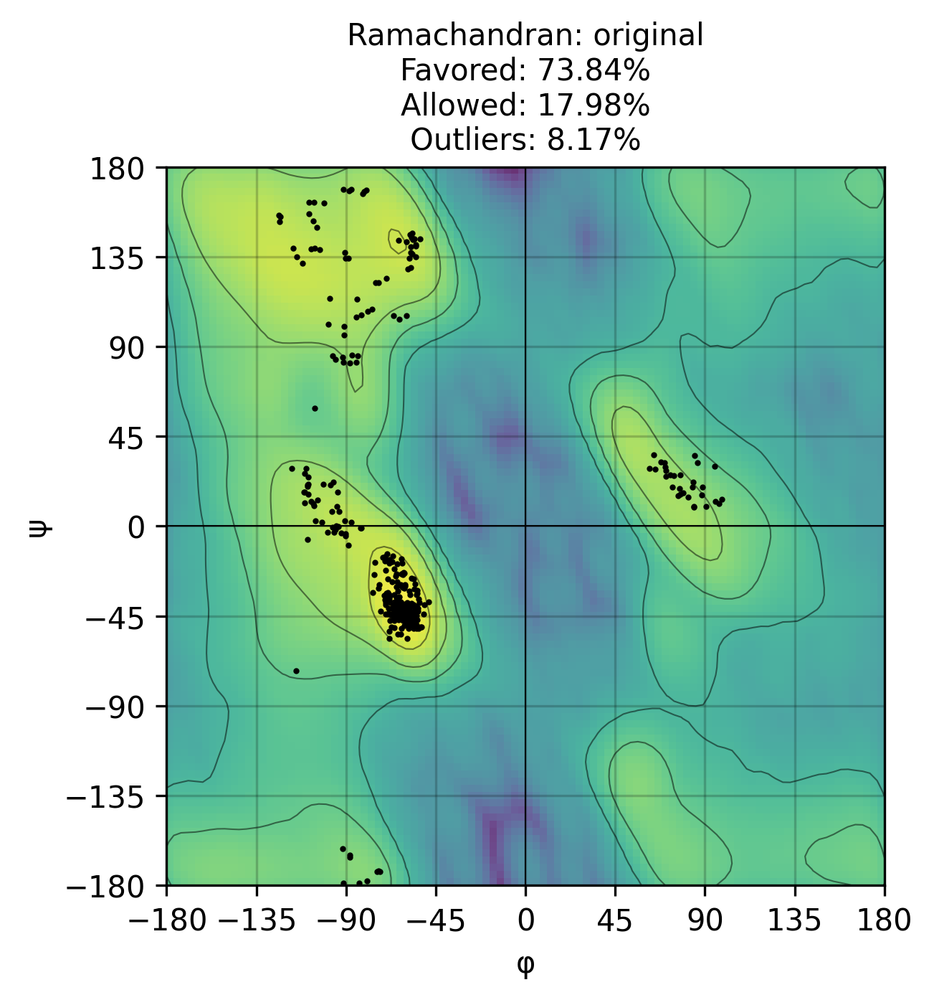

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_original_scored.png


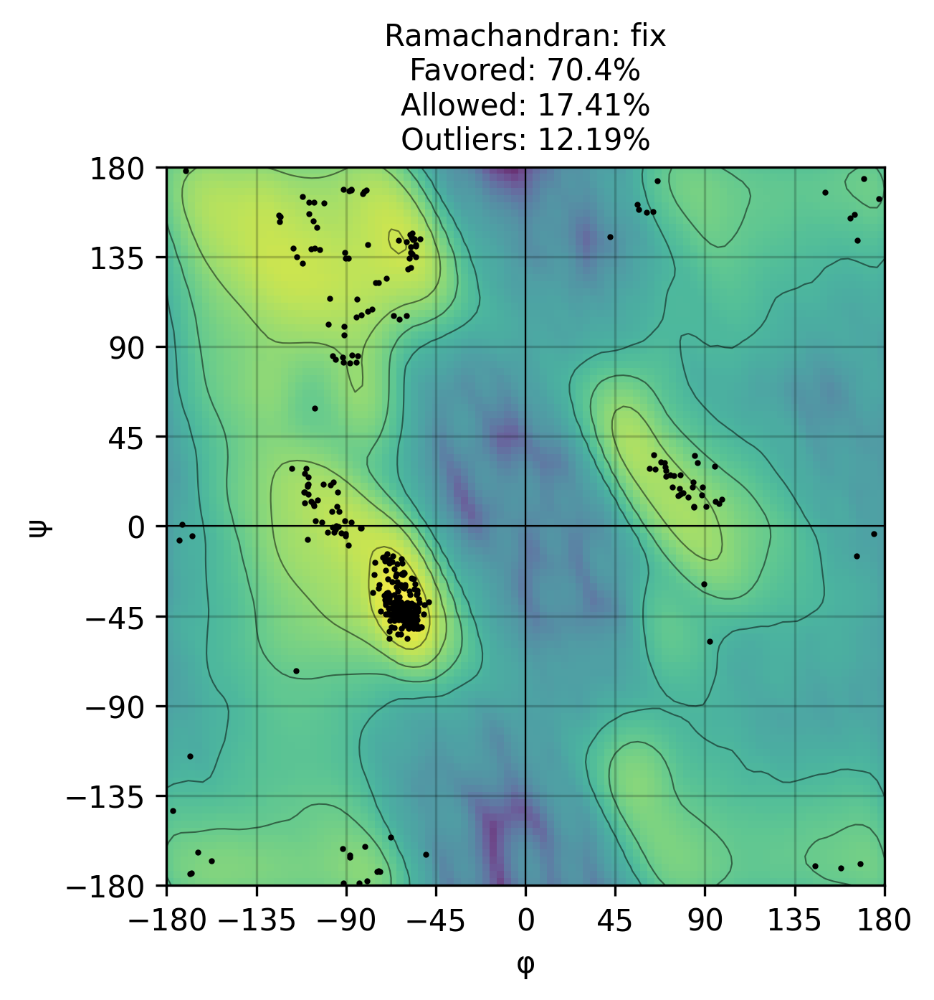

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_fix_scored.png


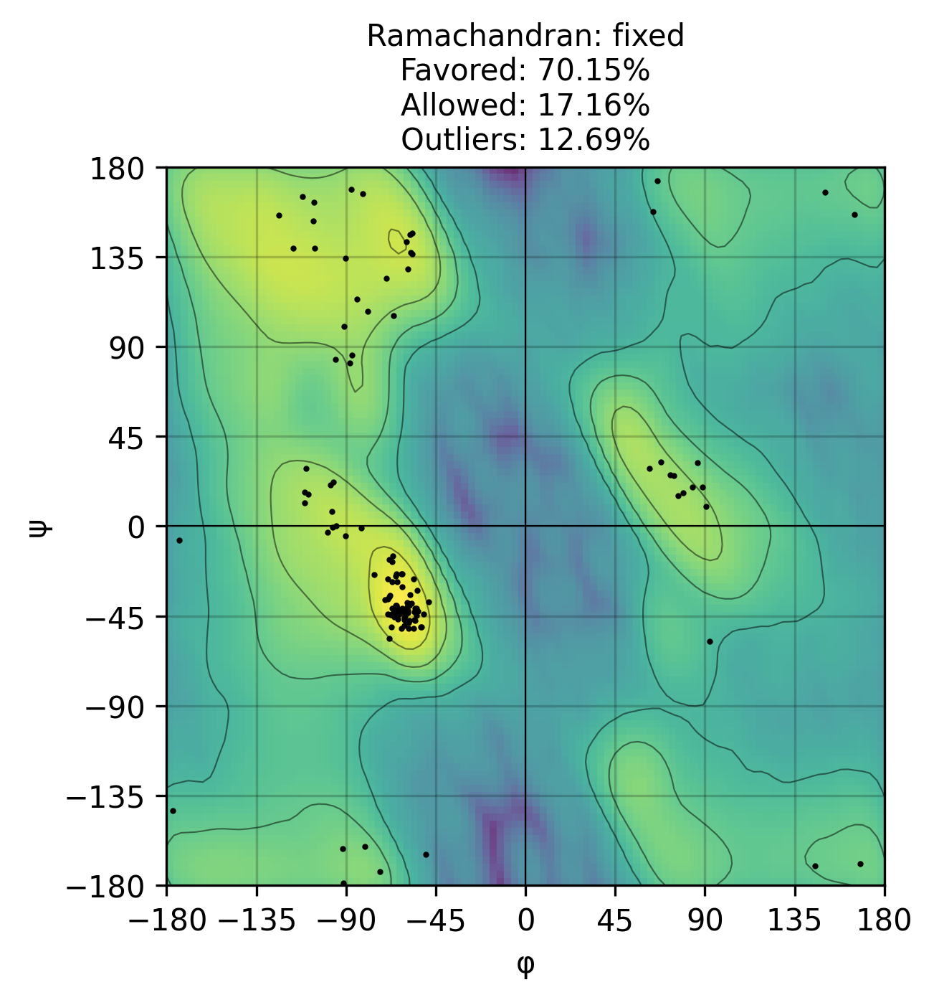

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_fixed_scored.png


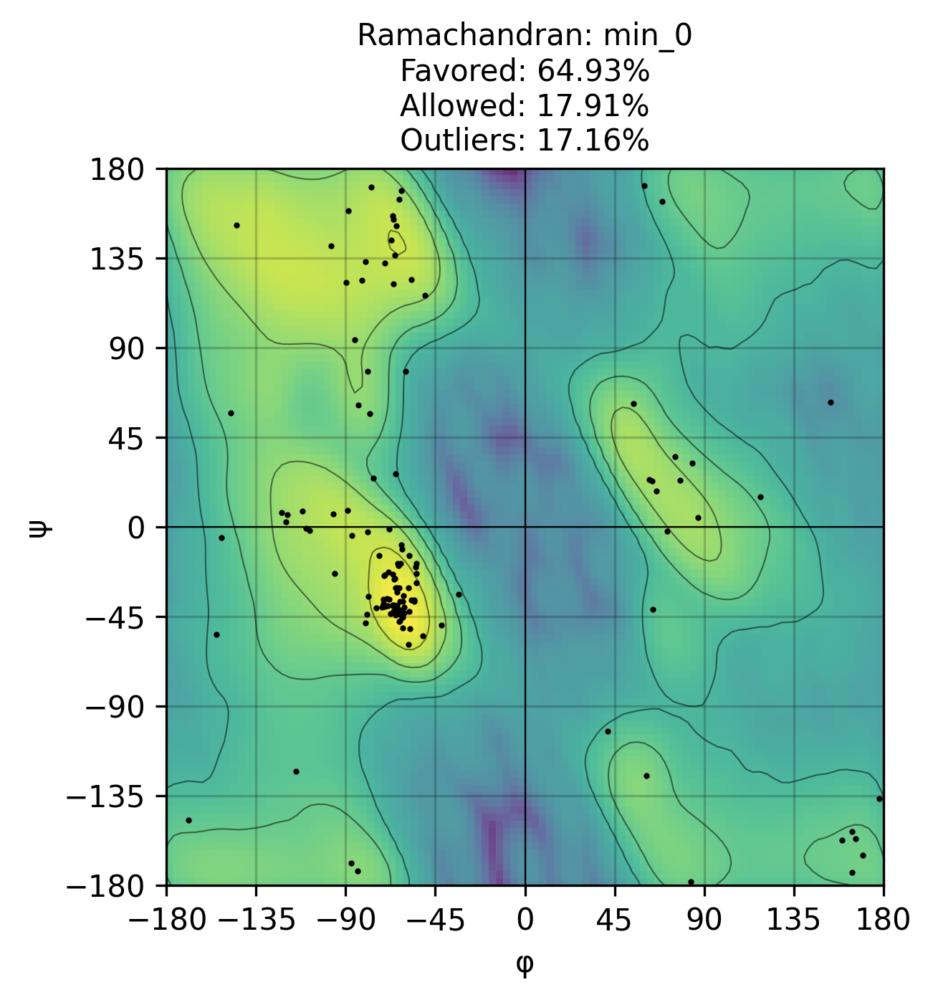

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_0_scored.png


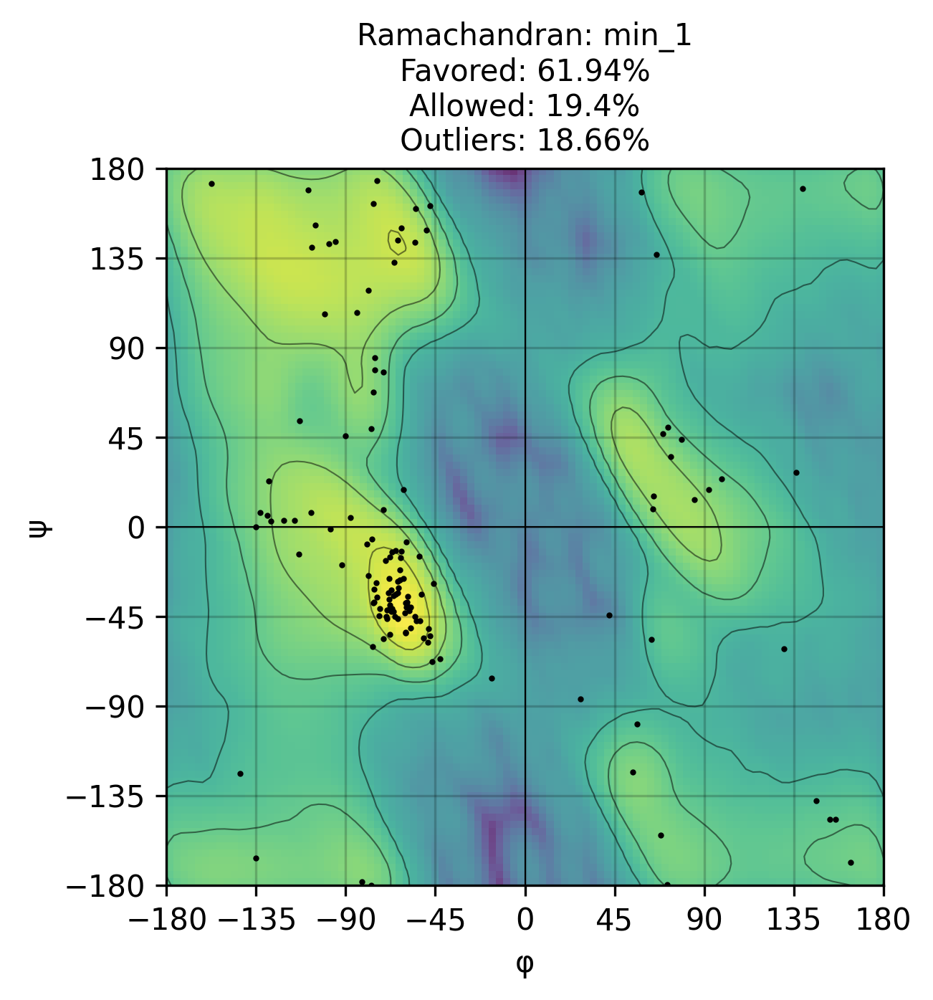

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_1_scored.png


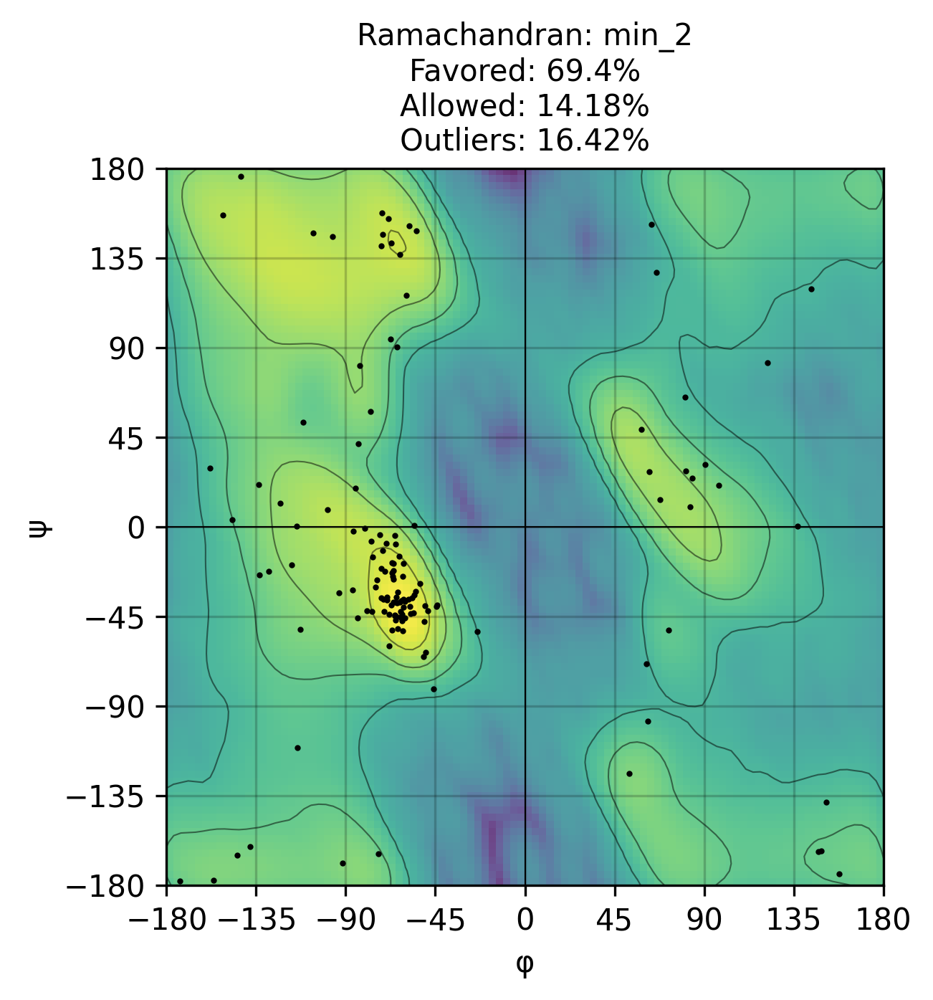

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_2_scored.png


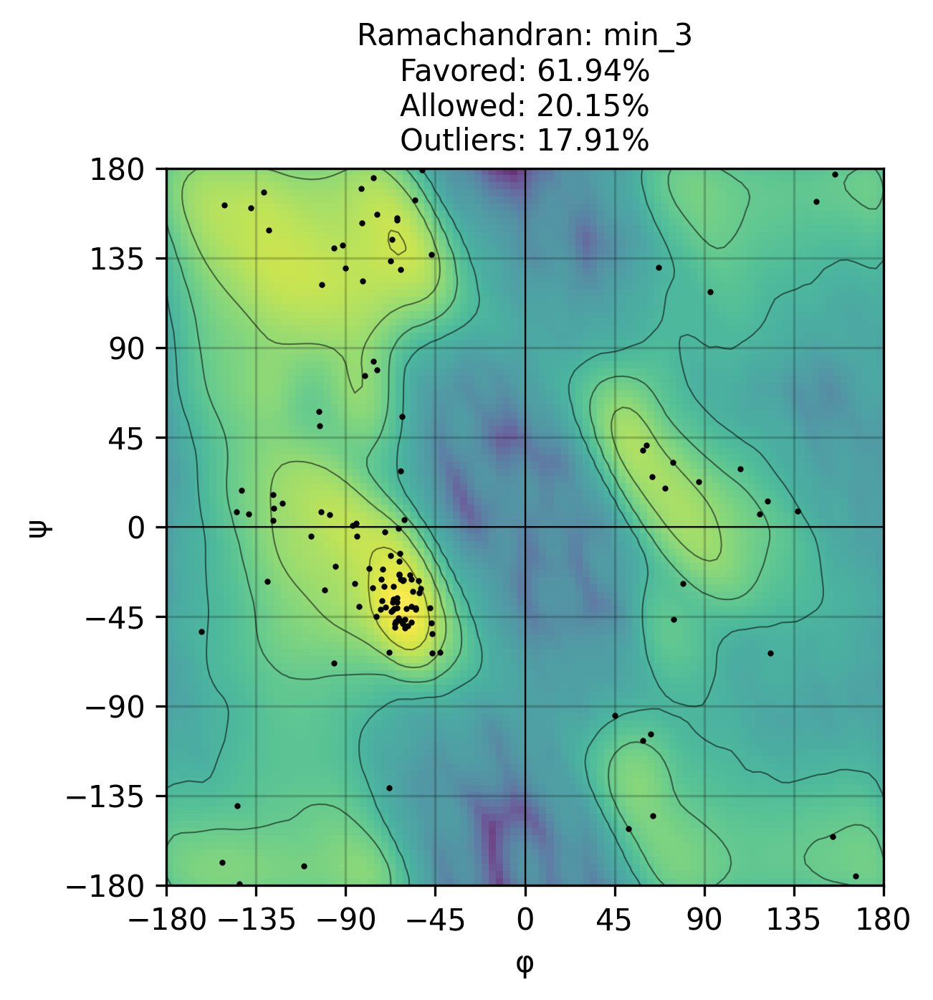

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_3_scored.png


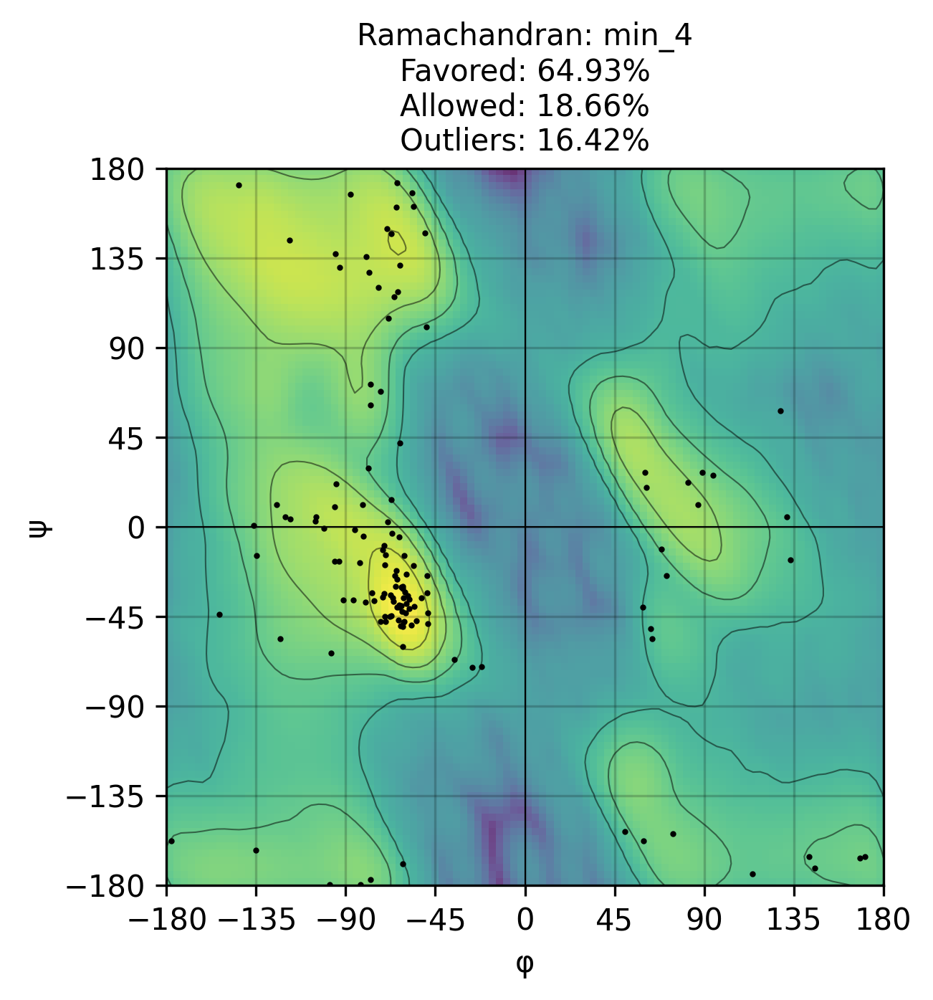

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_4_scored.png


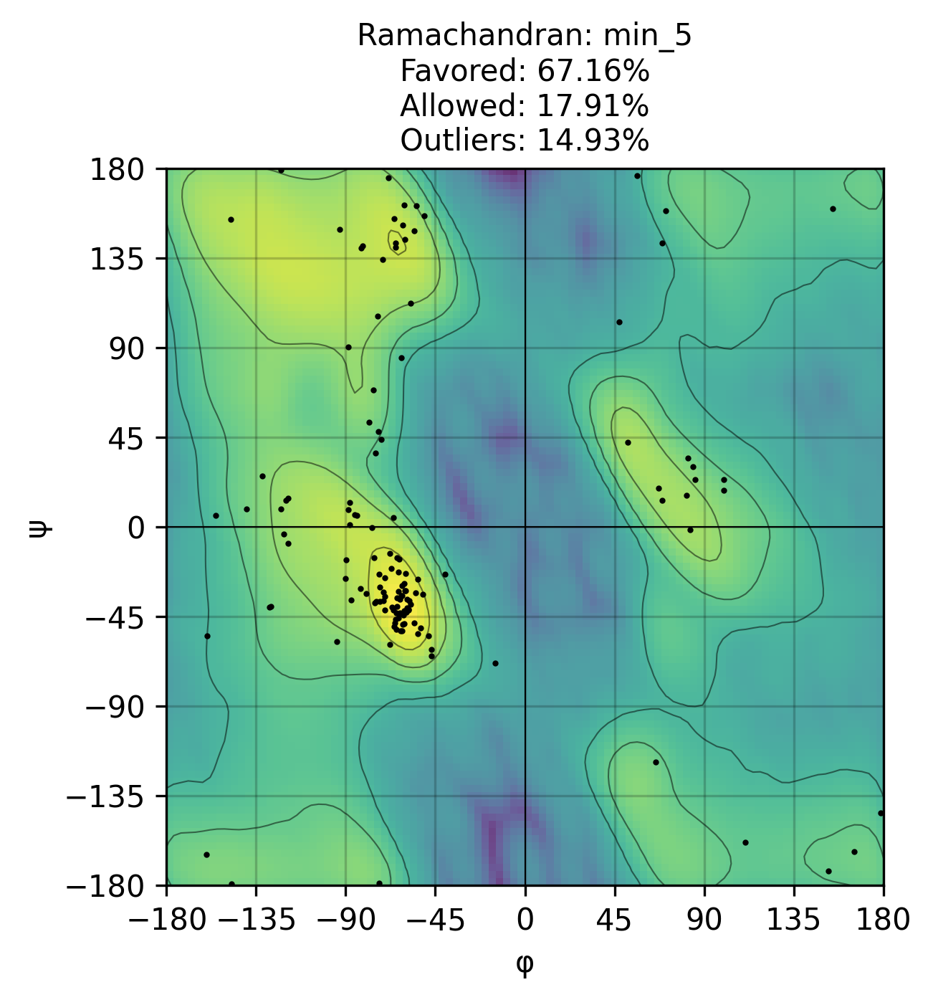

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_5_scored.png


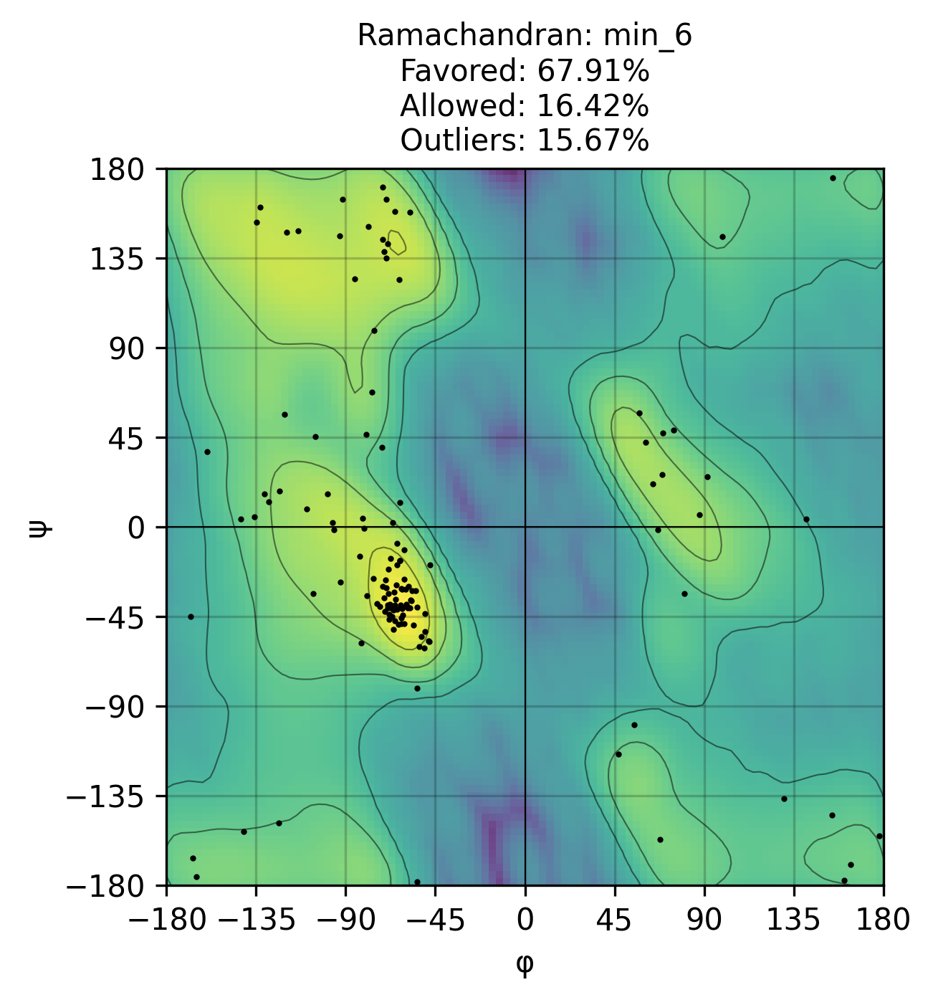

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_6_scored.png


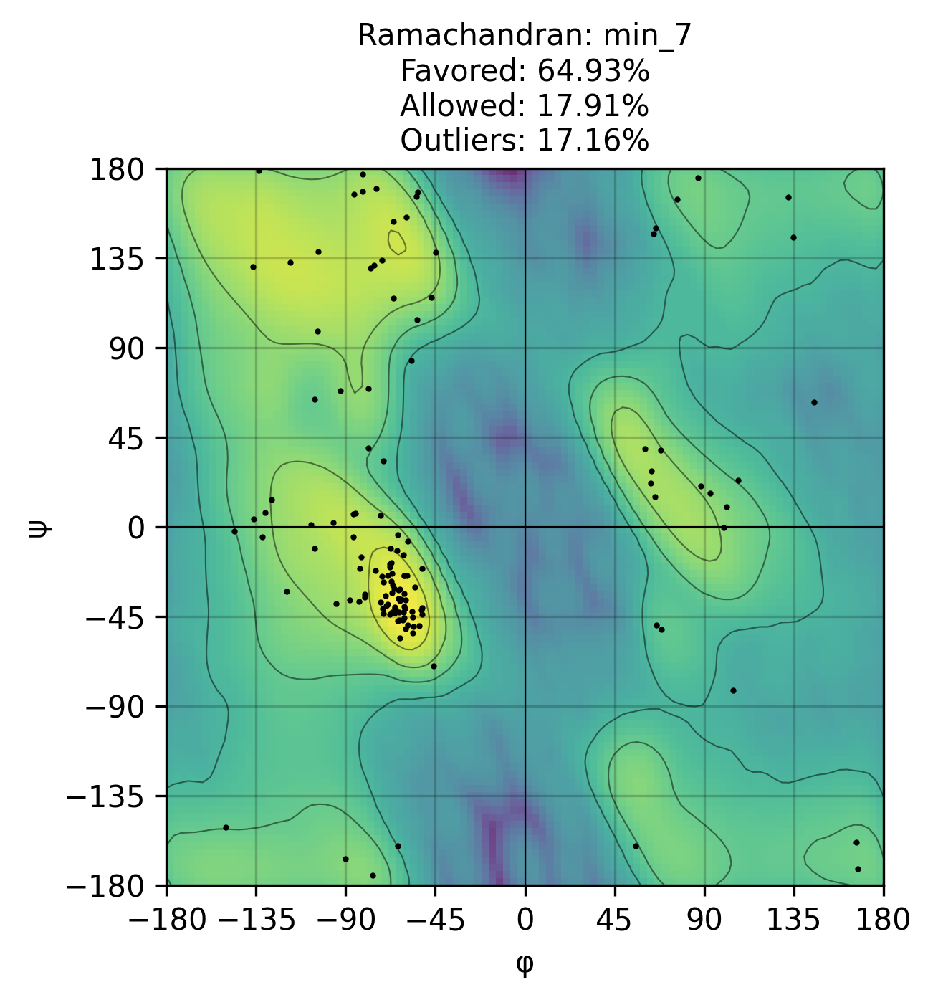

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_7_scored.png


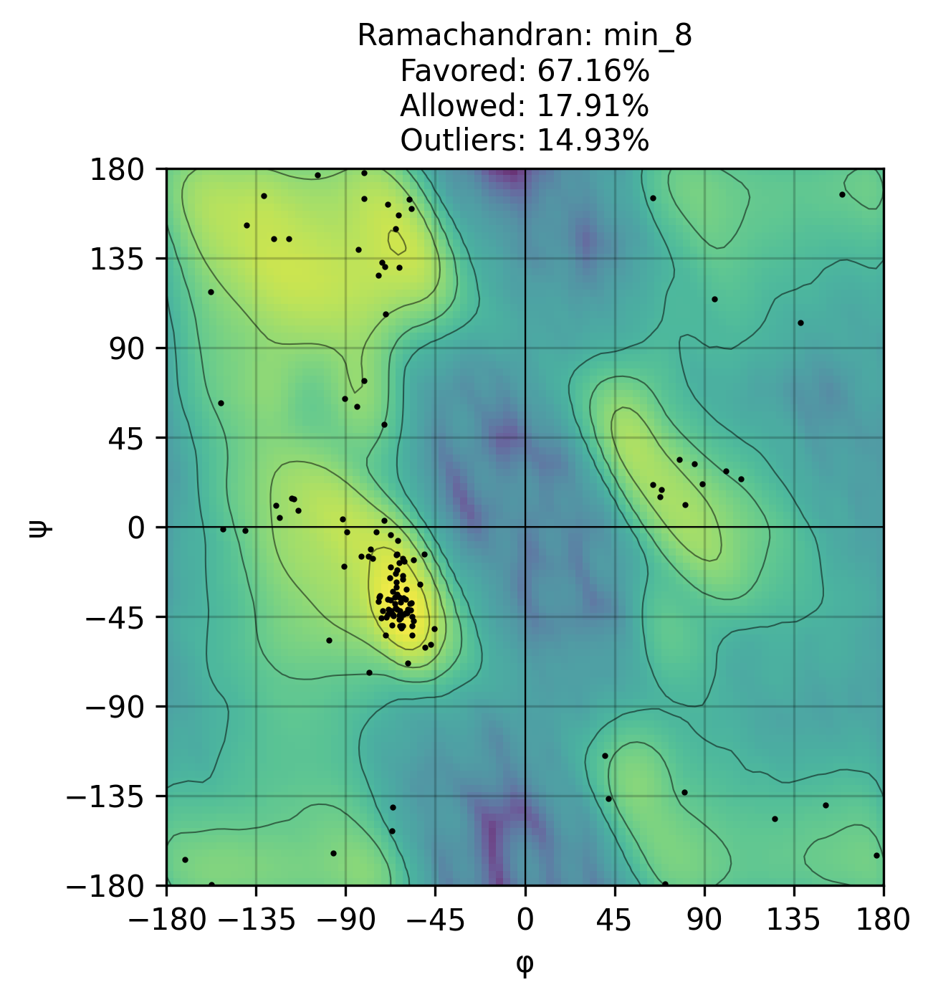

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_8_scored.png


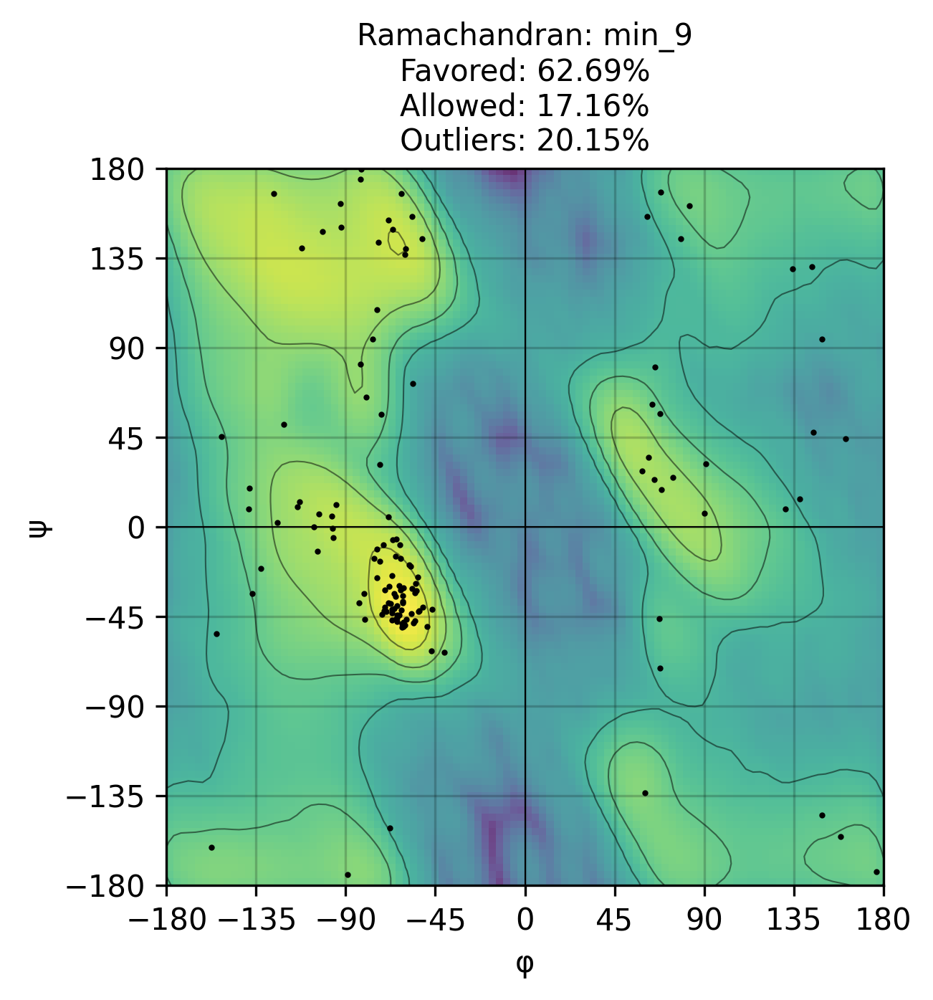

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_9_scored.png


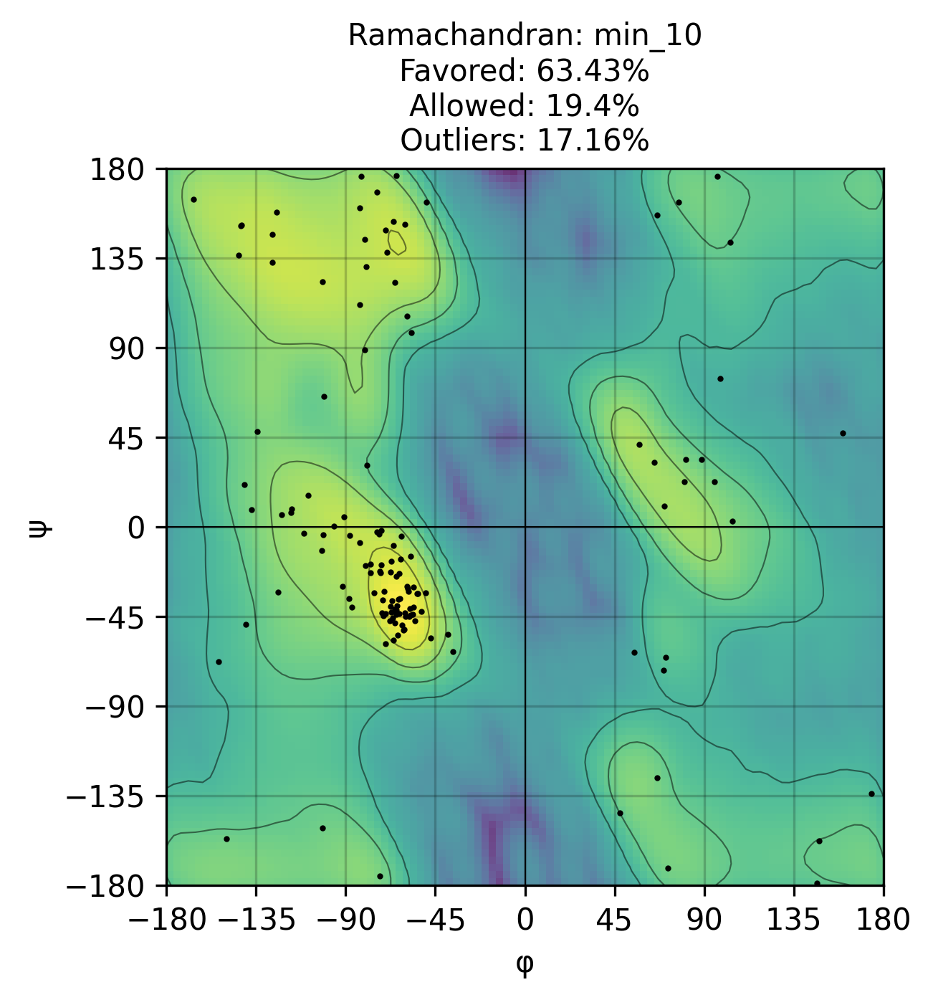

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_10_scored.png


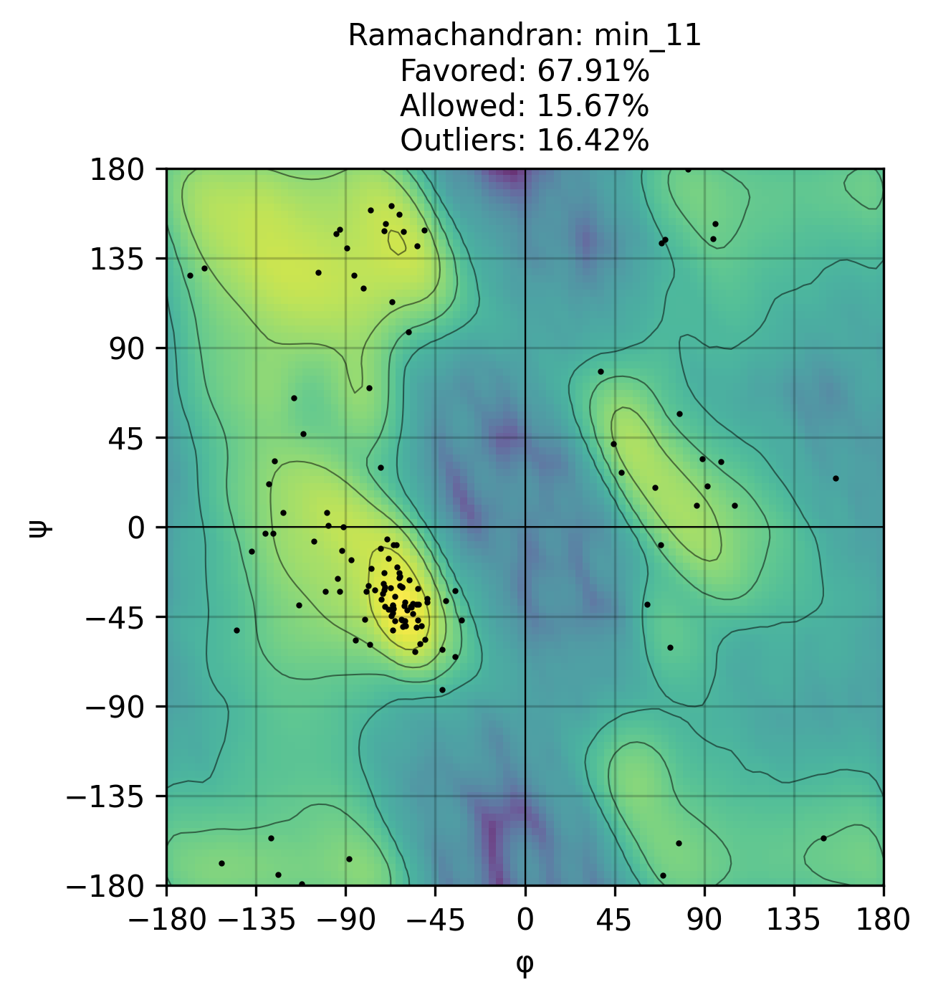

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_11_scored.png


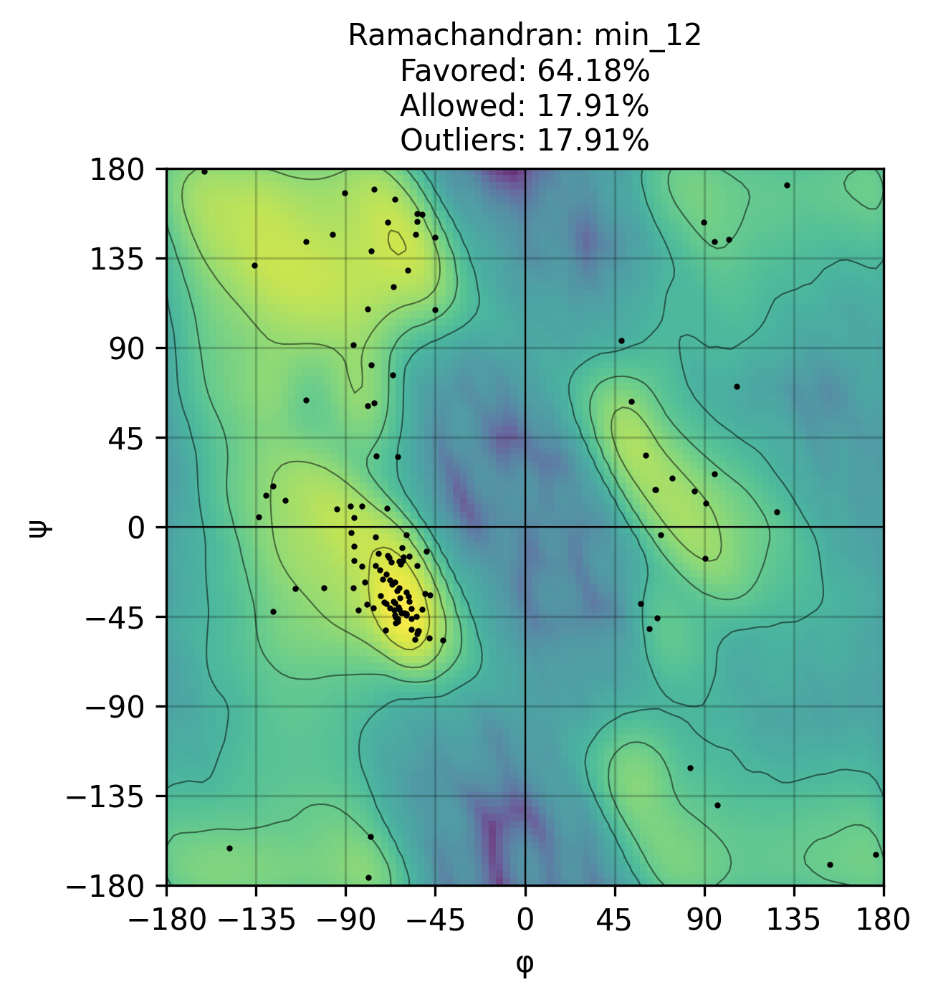

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_12_scored.png


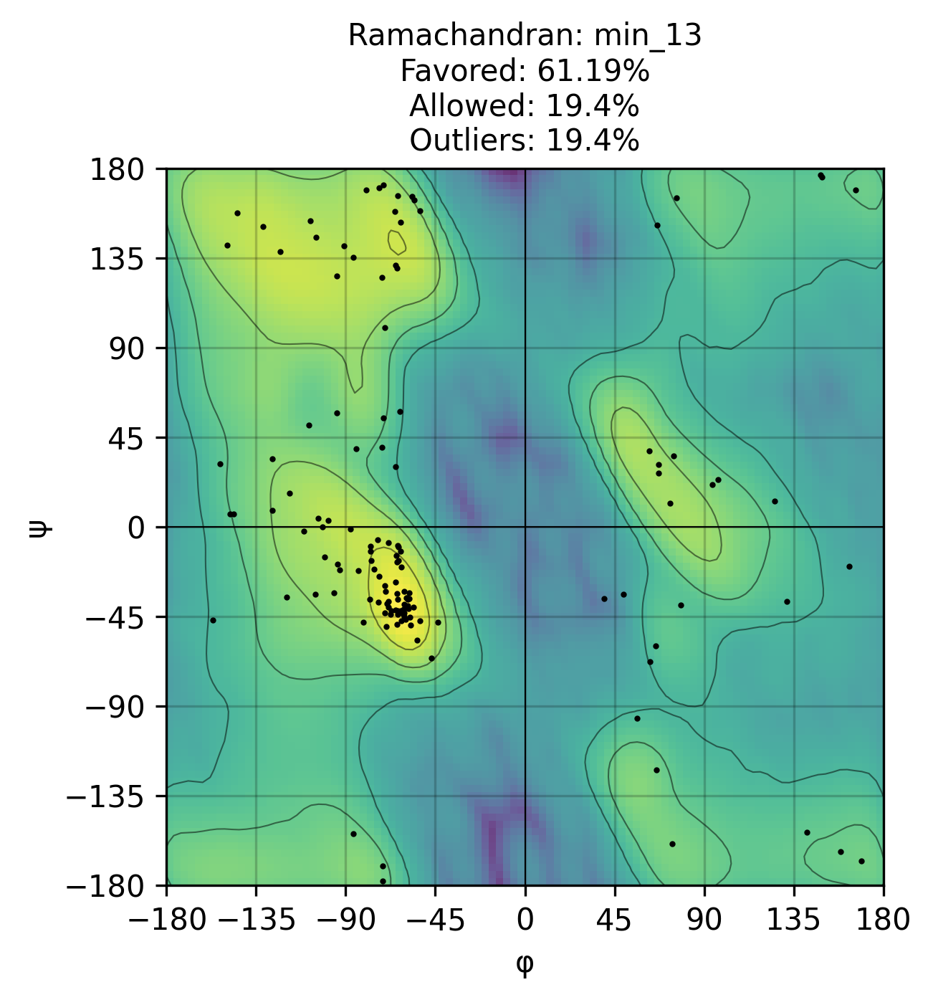

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_13_scored.png


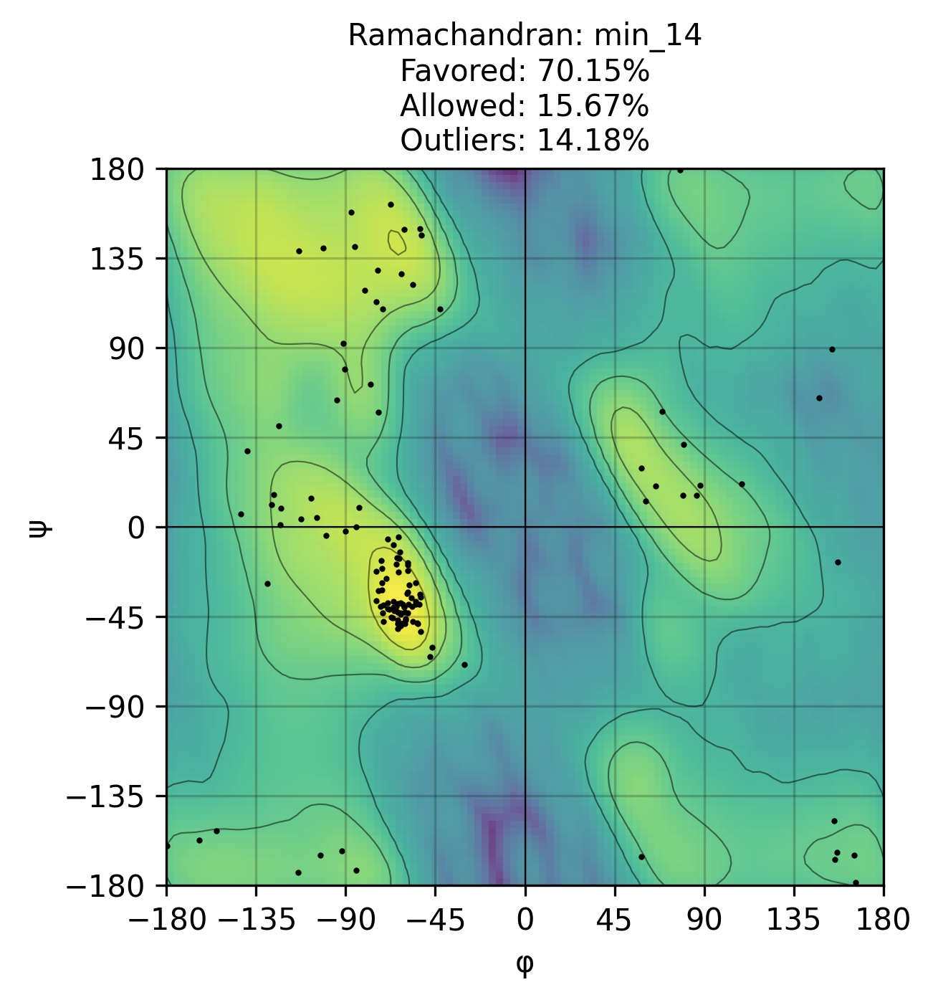

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_14_scored.png


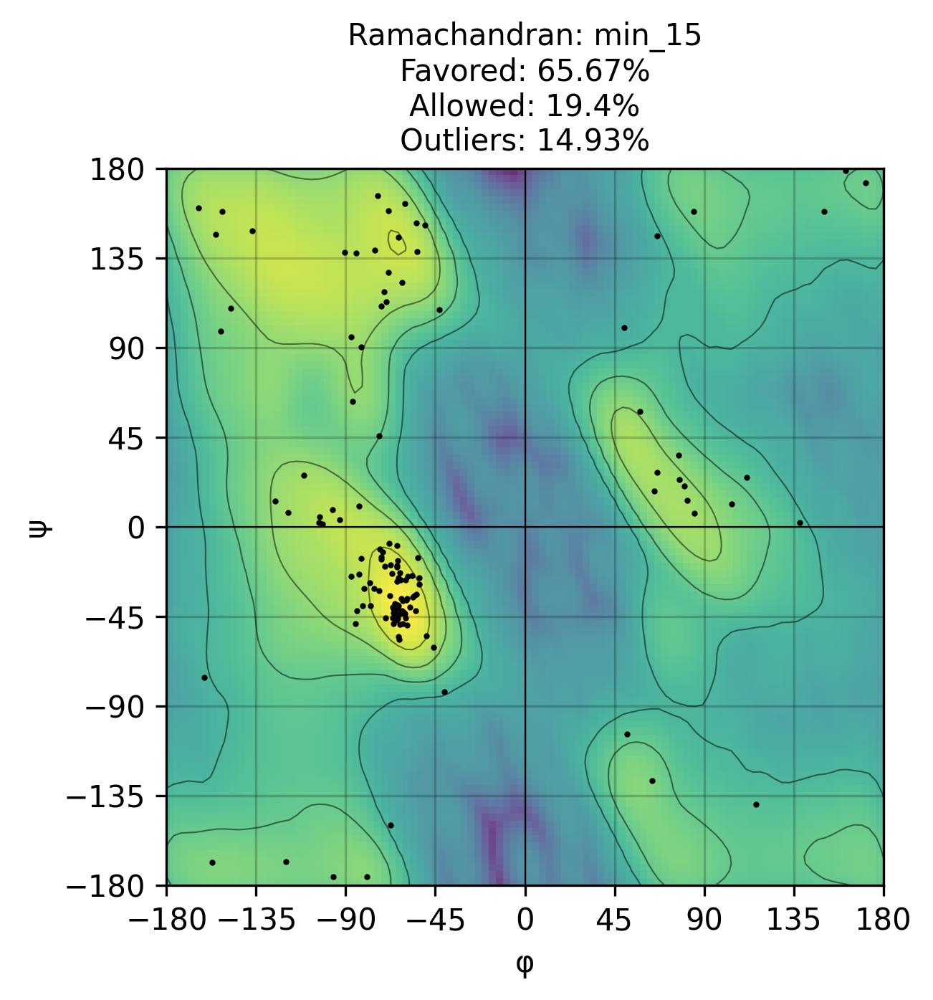

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_15_scored.png


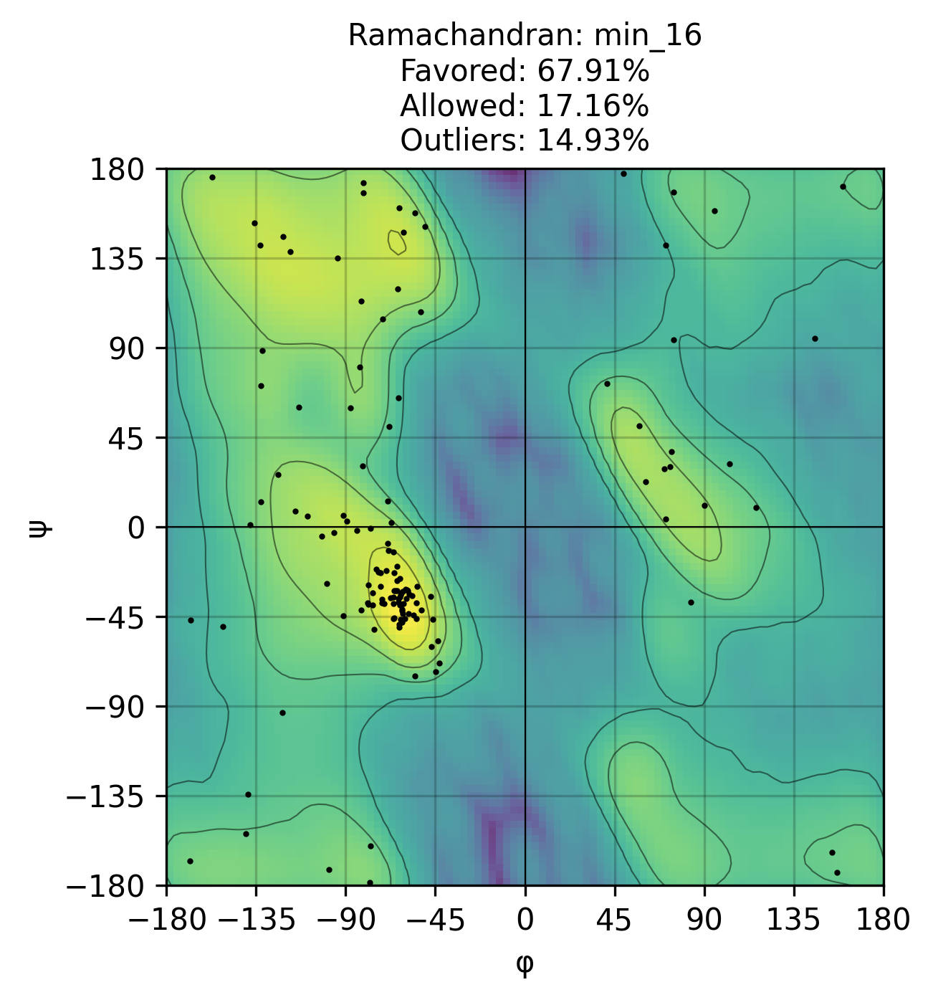

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_16_scored.png


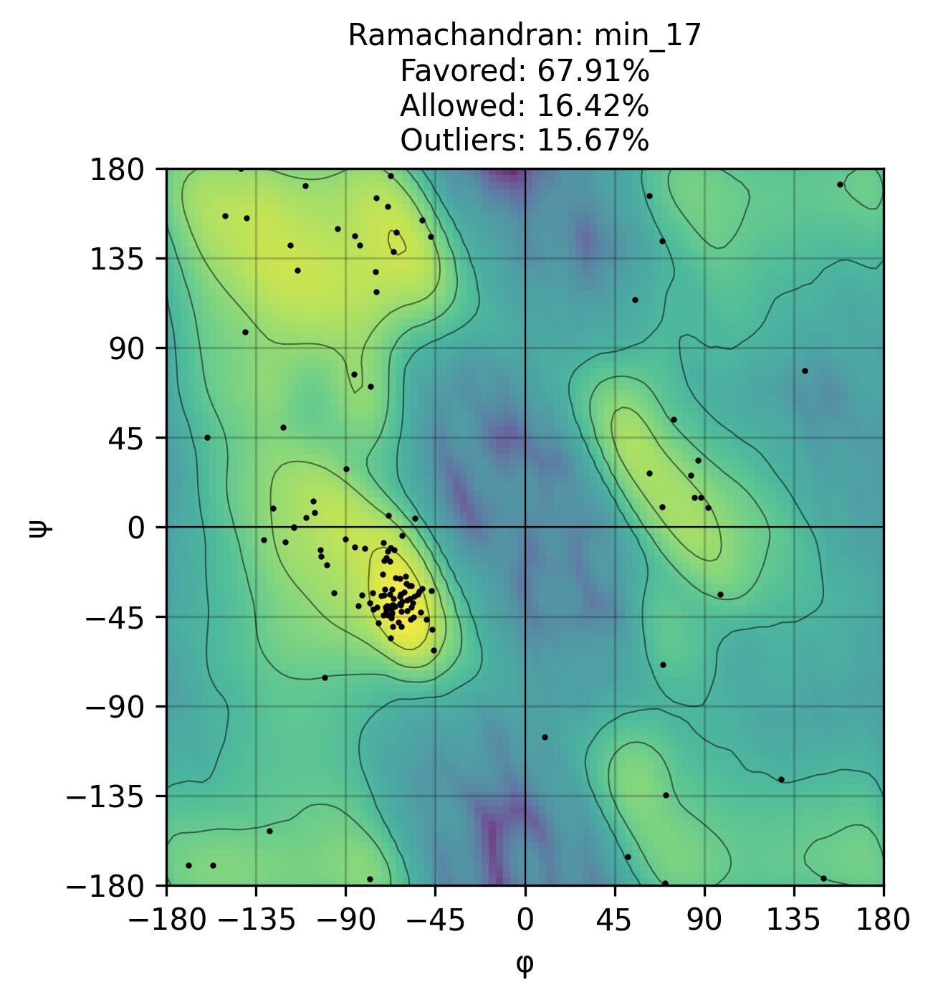

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_17_scored.png


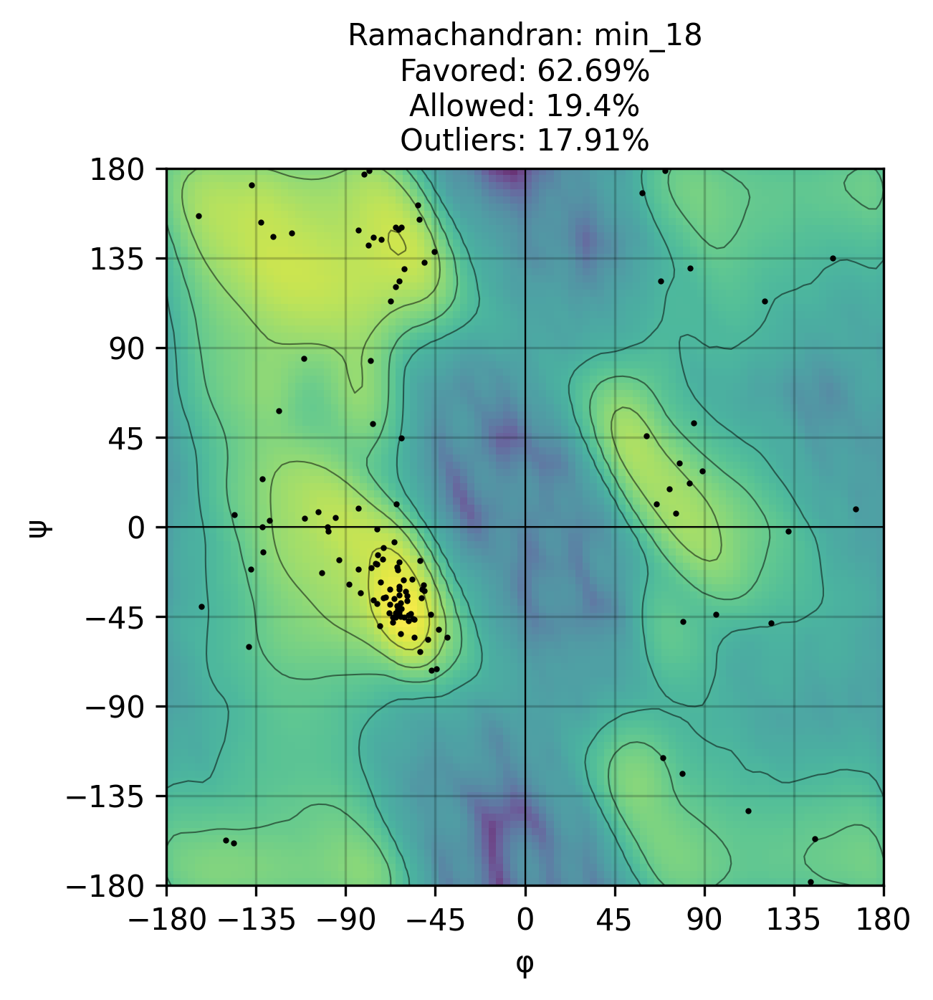

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_18_scored.png


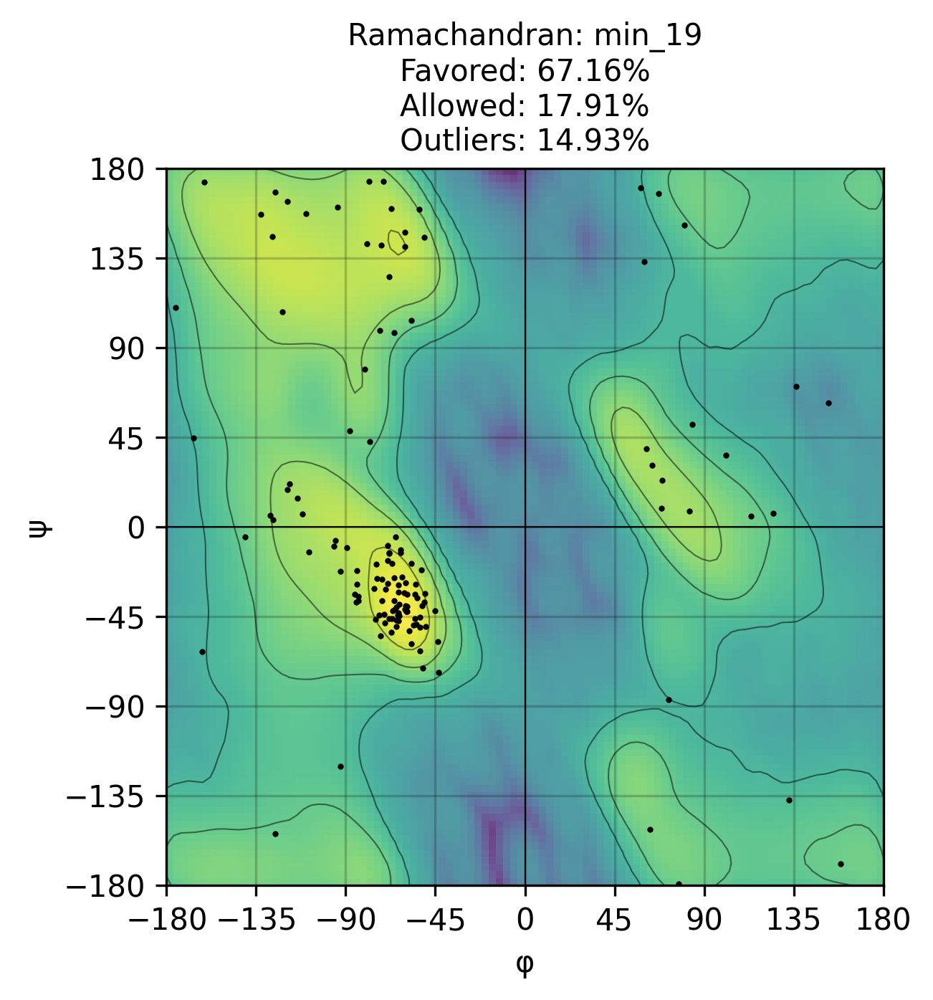

[✓] Saved with score: /content/drive/MyDrive/algo_project_hmh/ramachandran_plots_scored/rama_min_19_scored.png


In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from ramachandraw.parser import get_phi_psi
from ramachandraw.utils import plot

def classify_residues(phi_psi_dict):
    favored = 0
    allowed = 0
    outliers = 0

    for res, (phi, psi) in phi_psi_dict.items():
        if -180 <= phi <= -30 and -180 <= psi <= 45:
            favored += 1
        elif -180 <= phi <= 0 and -180 <= psi <= 180:
            allowed += 1
        else:
            outliers += 1

    total = favored + allowed + outliers
    return {
        "favored": round(100 * favored / total, 2),
        "allowed": round(100 * allowed / total, 2),
        "outliers": round(100 * outliers / total, 2)
    }

def plot_with_scores(pdb_file, out_path, title):
    phi_psi_dict = get_phi_psi(pdb_file)
    scores = classify_residues(phi_psi_dict)

    ax = plot(pdb_file, cmap="viridis", alpha=0.8, dpi=300, save=False, show=False)

    textstr = '\n'.join((
        f"Favored: {scores['favored']}%",
        f"Allowed: {scores['allowed']}%",
        f"Outliers: {scores['outliers']}%"
    ))
    plt.title(f"{title}\n{textstr}", fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(out_path, dpi=300)
    plt.show()
    plt.close()
    print(f"[✓] Saved with score: {out_path}")

base_dir = "/content/drive/MyDrive/algo_project_hmh"
output_dir = os.path.join(base_dir, "ramachandran_plots_scored")
min_dir = os.path.join(base_dir, "minimized")
os.makedirs(output_dir, exist_ok=True)

pdb_files = {
    "original": os.path.join(base_dir, "2JAB.pdb"),
    "fix": os.path.join(base_dir, "2jab_fix.pdb"),
    "fixed": os.path.join(base_dir, "2jab_fixed.pdb")
}
for file in os.listdir(min_dir):
    if file.endswith(".pdb"):
        name = file.replace(".pdb", "")
        pdb_files[name] = os.path.join(min_dir, file)

for name, path in pdb_files.items():
    save_path = os.path.join(output_dir, f"rama_{name}_scored.png")
    plot_with_scores(path, save_path, f"Ramachandran: {name}")
